In [ ]:
import pandas
import numpy as np
import seaborn as sns
import missingno as msno
import plotly.express as px
import statsmodels.api as sm
import matplotlib.pyplot as plt
from matplotlib import colors
from matplotlib.pyplot import show
from matplotlib.ticker import PercentFormatter
from plotnine import ggplot, aes, geom_histogram, scale_fill_manual
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.impute import KNNImputer
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from numpy.random import randn
from seaborn import heatmap
from itertools import combinations
from scipy.stats.mstats import zscore

In [ ]:
demo_df = pandas.read_sas('P_Demographics.XPT')
foods_df = pandas.read_sas('P_IndividualFoods.XPT')
nutritients_df = pandas.read_sas('P_TotalNutritient.XPT')
food_desc_df = pandas.read_sas('P_FoodDesc.XPT')

###Merging for classification###

9841
14300
                SEQN      WTDRD1PP      WTDR2DPP     DR1DRSTZ     DR1EXMER  \
count    4855.000000  4.855000e+03  4.424000e+03  4855.000000  4467.000000   
mean   117154.111843  2.647188e+04  2.887576e+04     1.328527    73.479293   
std      4508.146249  3.801739e+04  4.662351e+04     1.086210    20.926517   
min    109271.000000  5.397605e-79  5.397605e-79     1.000000    14.000000   
25%    113257.000000  6.801146e+03  5.072887e+03     1.000000    73.000000   
50%    117188.000000  1.440773e+04  1.399962e+04     1.000000    81.000000   
75%    121060.500000  3.088995e+04  3.303763e+04     1.000000    86.000000   
max    124822.000000  4.793657e+05  5.578856e+05     5.000000    94.000000   

        DRABF       DRDINT      DR1DBIH       DR1DAY      DR1LANG  ...  \
count  4424.0  4424.000000  4195.000000  4467.000000  4472.000000  ...   
mean      2.0     1.842676    11.980453     4.549810     1.141100  ...   
std       0.0     0.364147    12.910484     2.191548     0.51023

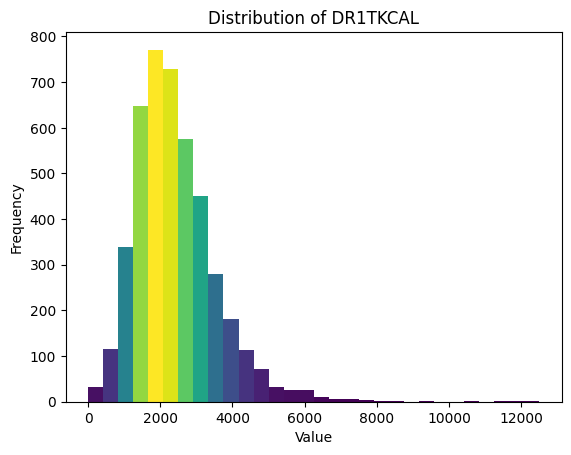

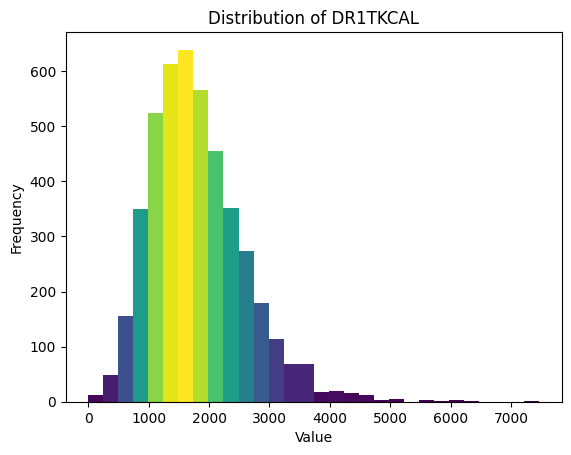

8730
8730
7502
(7502, 75)
       SEQN      WTDRD1PP      WTDR2DPP  DRDINT  DRQSPREP  DRQSDIET  DRQSDT1  \
0  109266.0   6831.068440   5988.203624     2.0       4.0       1.0      1.0   
1  109271.0  15526.880504  15977.650915     2.0       1.0       2.0      NaN   
2  109273.0  40576.776836  56511.019998     2.0       2.0       2.0      NaN   
3  109274.0  12294.159900  12374.817962     2.0       2.0       2.0      NaN   
4  109279.0   6349.724162   5505.718050     2.0       4.0       2.0      NaN   
5  109282.0  50137.823058  50466.761323     2.0       4.0       2.0      NaN   
6  109284.0   9228.172333   7746.670398     2.0       4.0       2.0      NaN   
7  109285.0  28816.600368  63015.780042     2.0       3.0       1.0      NaN   
8  109290.0   6963.738481   6414.623715     2.0       1.0       2.0      NaN   
9  109291.0  12733.439510  27963.088586     2.0       2.0       1.0      1.0   

   DRQSDT2  DRQSDT3  DRQSDT4  ...      DR1_320Z  GENDR  AGE_YR  RACE  PERIOD  \
0      NaN   

In [ ]:
# cleaning demographical data
complete_data = demo_df.drop(columns = ['SDDSRVYR', 'RIDRETH1', 'SIALANG', 'SIAPROXY', 'SIAINTRP', 'FIALANG',
                        'FIAPROXY', 'FIAINTRP', 'MIALANG', 'MIAPROXY', 'MIAINTRP', 'AIALANGA',
                        'WTINTPRP', 'WTINTPRP', 'WTMECPRP', 'SDMVPSU', 'SDMVSTRA'])
complete_data = complete_data.rename(columns={'RIDSTATR': 'INTRVW_STATUS', 'RIAGENDR':'GENDR',
                        'RIDAGEYR':'AGE_YR', 'RIDAGEMN':'AGEMNS', 'RIDRETH3':'RACE',
                        'RIDEXMON': 'PERIOD', 'DMDBORN4':'ORGCOUNTRY',
                        'DMDYRUSZ':'TIMEUS', 'DMDEDUC2':'EDUCTN', 'DMDMARTZ':'MARITALSTS',
                        'RIDEXPRG': 'PREGNSTATUS', 'INDFMPIR': 'INCOMEPOVERTY'})
# leave only resopndents who have MEC data
complete_data = complete_data[complete_data['INTRVW_STATUS'] == 2]
# are older than 14 years
complete_data = complete_data[complete_data['AGE_YR'] >= 14]
# are not pregnant
complete_data = complete_data[complete_data['PREGNSTATUS'] != 1]
# columns INTRVW_STATUS, AGEMNS, PREGSTATUS won`t be included in model
complete_data = complete_data.drop(columns = ['INTRVW_STATUS', 'AGEMNS', 'PREGNSTATUS'])

# added nutritients data of suitable members of survey only
sequence_nums = complete_data['SEQN']
nutritients_df = nutritients_df.merge(complete_data, how='inner', on='SEQN')

# indentifying outliers in kcal consumption
kcal_m = nutritients_df[nutritients_df['GENDR'] == 1]
print(kcal_m.describe())
kcal_f = nutritients_df[nutritients_df['GENDR'] == 2]
print(kcal_f.describe())

# Partly taken from https://matplotlib.org/stable/gallery/statistics/hist.html
# N is the count in each bin, bins is the lower-limit of the bin

N, bins, patches = plt.hist(kcal_m['DR1TKCAL'], bins=30)
fracs = N / N.max()
norm = colors.Normalize(fracs.min(), fracs.max())
for thisfrac, thispatch in zip(fracs, patches):
    color = plt.cm.viridis(norm(thisfrac))
    thispatch.set_facecolor(color)
plt.title('Distribution of DR1TKCAL')
plt.xlabel('Value')
plt.ylabel('Frequency')
plt.show()


N, bins, patches = plt.hist(kcal_f['DR1TKCAL'], bins=30)
fracs = N / N.max()
norm = colors.Normalize(fracs.min(), fracs.max())
for thisfrac, thispatch in zip(fracs, patches):
    color = plt.cm.viridis(norm(thisfrac))
    thispatch.set_facecolor(color)
plt.title('Distribution of DR1TKCAL')
plt.xlabel('Value')
plt.ylabel('Frequency')
plt.show()


c_1 = (nutritients_df['GENDR'] == 1) & (nutritients_df['DR1TKCAL'].between(600, 6000))
c_2 = (nutritients_df['GENDR'] == 2) & (nutritients_df['DR1TKCAL'].between(500, 4500))
nutritients_df = nutritients_df[(c_1) | (c_2)]

print(len(nutritients_df))


# only reliable results
filt_nutr_df = nutritients_df[nutritients_df['DR1DRSTZ'] == 1]
print(len(filt_nutr_df))

# only people with data about 2 days
filt_nutr_df = filt_nutr_df[filt_nutr_df['DRDINT'] == 2]
print(len(filt_nutr_df))
filt_nutr_df = filt_nutr_df.drop(columns = ['DR1DRSTZ', 'DR1EXMER', 'DBQ095Z', 'DBD100', 'DRABF', 'DR1DBIH', 'DR1DAY',  'DR1LANG', 'DR1MRESP', 'DR1HELP', 'DR1STY', 'DR1SKY', 'DR1TMOIS',
# 'DR1TVB1', 'DR1TVB2', 'DR1TNIAC', 'DR1TFOLA', 'DR1TFA', 'DR1TFF', 'DR1TFDFE', 'DR1TCHL', 'DR1TB12A', 'DR1TCOPP', 'DR1TTHEO',
'DR1TS040', 'DR1TS060', 'DR1TS080', 'DR1TS100', 'DR1TS120', 'DR1TS140', 'DR1TS160', 'DR1TS180', 'DR1TM161', 'DR1TM181', 'DR1TM201', 'DR1TM221', 'DR1TP182', 'DR1TP183',
'DR1TP184', 'DR1TP204', 'DR1TP205', 'DR1TP225', 'DR1TP226', 'DR1_300', 'DR1TWSZ', 'DRD350A', 'DRD350AQ', 'DRD350B', 'DRD350BQ', 'DRD350C', 'DRD350CQ', 'DRD350D', 'DRD350DQ',
'DRD350E', 'DRD350EQ', 'DRD350F', 'DRD350FQ', 'DRD350G', 'DRD350GQ', 'DRD350HQ', 'DRD350I', 'DRD350IQ', 'DRD350J', 'DRD350JQ', 'DRD350K', 'DRD370A', 'DRD370AQ', 'DRD370BQ', 'DRD370C',
'DRD370CQ', 'DRD370D', 'DRD370DQ', 'DRD370E', 'DRD370EQ', 'DRD370F', 'DRD370FQ', 'DRD370G', 'DRD370GQ', 'DRD370H', 'DRD370HQ', 'DRD370I', 'DRD370IQ', 'DRD370J', 'DRD370JQ', 'DRD370K', 'DRD370KQ',
 'DRD370L', 'DRD370LQ', 'DRD370MQ', 'DRD370N', 'DRD370NQ', 'DRD370O', 'DRD370OQ', 'DRD370P', 'DRD370PQ', 'DRD370Q', 'DRD370QQ', 'DRD370R', 'DRD370RQ', 'DRD370S', 'DRD370SQ', 'DRD370T', 'DRD370TQ',
'DRD370U', 'DRD370UQ', 'DRD370V', 'DR1_330Z', 'DR1BWATZ', 'DRD340', 'DRD350H', 'DRD360', 'DRD370B', 'DRD370M'])
print(filt_nutr_df.shape)
print(filt_nutr_df.head(10))

complete_data = filt_nutr_df.copy(deep=False)

complete_data = complete_data.rename(columns={'WTDRD1PP': 'D1SMPLWEIGHT', 'WTDR2DPP': 'D2SMPLWEIGHT', 'DRQSPREP':'SALTUSE',
'DRQSDIET':'SPECDIET', 'DRQSDT1':'LOWCALD', 'DRQSDT2':'LOWFATD', 'DRQSDT3':'LOWSALTD', 'DRQSDT4': 'SUGARFREED', 'DRQSDT5':'LOWFIBERD', 'DRQSDT6': 'HIGHFIBERD', 'DRQSDT7':'DIABETICD',
'DRQSDT8':'WEIGHTGAIND', 'DRQSDT9':'LOWCARBSD', 'DRQSDT10':'HIGHPROTD', 'DRQSDT11':'GLUTENFREED', 'DRQSDT12':'KIDNEYD', 'DRQSDT91':'OTHERSPECD', 'DR1_320Z':'WATERCONS'})

print(complete_data.shape)

In [ ]:
food_groups_handwritten = pandas.read_excel('food_groups.xlsx')
wweia_codes = pandas.read_excel('WWEIA2017_March2020_foodcat_FNDDS.xlsx')

def lookup_category(code):
    return wweia_codes.loc[wweia_codes['food_code'] == code, 'category_number'].values[0]

def lookup_food_group(code):
    return food_groups_handwritten.loc[code]['SEQN_NUM']

def preprocess_individual_foods(foods_data):
    # initial data set view
    print('\nIndividualFoods before preprocessing')
    print(foods_data.shape)
    print(foods_data.head(10))
    # take necessary columns ['SEQN', 'DR1IFDCD', 'DR1IGRMS', 'DR1IKCAL']
    # questionable columns: DR1CCMNM - Combination food number
    foods_groups = pandas.concat([foods_data['SEQN'], foods_data['DR1IFDCD'], foods_data['DR1IGRMS'], foods_data['DR1IKCAL']], axis=1, keys=['SEQN', 'USDA_CODE', 'D1_GRAMS', 'D1_KCAL'])
    print(foods_groups.head(10))
    # change foods to food's group number from WWEIA
    print('\nWWEIA codes file')
    print(wweia_codes.head(10))
    # change foods to more general self defined groups

    print('\n46 groups data')
    print(food_groups_handwritten.head(10))
    foods_groups['USDA_CODE'] = foods_groups['USDA_CODE'].apply(lambda x: lookup_category(x))
    print('\nData changed according to WWEIA codes')
    print(f'# of rows: {len(foods_groups)}')
    print(foods_groups.head(10))
    grouped_foods_df = foods_groups.groupby(['SEQN', 'USDA_CODE']).agg({'D1_GRAMS': 'sum', 'D1_KCAL': 'sum'}).reset_index()
    print('\nData changed according to WWEIA codes after grouping')
    print(f'# of rows: {len(grouped_foods_df)}')
    print(grouped_foods_df.head(10))

    print('Data grouped by 46 categories')
    food_groups_handwritten.set_index('CTGR_NUM', inplace=True)
    print(food_groups_handwritten.head(10))
    grouped_foods_df['USDA_CODE'] = grouped_foods_df['USDA_CODE'].apply(lambda x: lookup_food_group(x))
    grouped_foods_df = grouped_foods_df.groupby(['SEQN', 'USDA_CODE']).agg({'D1_GRAMS': 'sum', 'D1_KCAL': 'sum'}).reset_index()
    print('\nData changed according to 46 food groups after grouping')
    print(f'# of rows: {len(grouped_foods_df)}')
    print(grouped_foods_df.head(10))

    # create column for each group
    groups_intake_df = grouped_foods_df.copy(deep=False)
    groups_intake_df = groups_intake_df.pivot_table(index='SEQN', columns='USDA_CODE', values='D1_KCAL').reset_index()
    groups_intake_df.fillna(0, inplace=True)
    groups_intake_df.set_index('SEQN', inplace=True)
    print('\nData with representation of each group as column')
    print(f'# of rows: {len(groups_intake_df)}')
    print(groups_intake_df.head(10))
    return groups_intake_df

groupped_intake_day_1 = preprocess_individual_foods(foods_df)



IndividualFoods before preprocessing
(183910, 84)
       SEQN     WTDRD1PP      WTDR2DPP  DR1ILINE  DR1DRSTZ  DR1EXMER  DRABF  \
0  109263.0  7619.483586  17808.067666      12.0       1.0      14.0    2.0   
1  109263.0  7619.483586  17808.067666      10.0       1.0      14.0    2.0   
2  109263.0  7619.483586  17808.067666       4.0       1.0      14.0    2.0   
3  109263.0  7619.483586  17808.067666       9.0       1.0      14.0    2.0   
4  109263.0  7619.483586  17808.067666      13.0       1.0      14.0    2.0   
5  109263.0  7619.483586  17808.067666       6.0       1.0      14.0    2.0   
6  109263.0  7619.483586  17808.067666       8.0       1.0      14.0    2.0   
7  109263.0  7619.483586  17808.067666       3.0       1.0      14.0    2.0   
8  109263.0  7619.483586  17808.067666       2.0       1.0      14.0    2.0   
9  109263.0  7619.483586  17808.067666       7.0       1.0      14.0    2.0   

   DRDINT  DR1DBIH  DR1DAY  ...      DR1IM181      DR1IM201      DR1IM221  \
0 

In [ ]:
print('\nPrevious data shape')
print(complete_data.shape)
print('\nIndividuals foods current shape')
groupped_intake_day_1.columns = ['GROUP_' + str(col) for col in groupped_intake_day_1.columns]
groupped_intake_day_1['DR1IKCAL'] = groupped_intake_day_1.sum(axis=1, numeric_only=True)
print(groupped_intake_day_1.columns)
print(groupped_intake_day_1.head())
complete_data = complete_data.merge(groupped_intake_day_1, how='inner', on='SEQN')
print('\nComplete data')
print(f'Shape {complete_data.shape}')
print(complete_data.head(10))
# counting the relation of each food group eaten during the day to the general amount of food consumed that day
for i in range(1, 47):
    complete_data[f'GROUP_{i}'] = complete_data[f'GROUP_{i}']/complete_data['DR1IKCAL']
print('\nComplete data - relation of food groups')
complete_data.drop(columns=['DR1IKCAL', 'D2SMPLWEIGHT', 'DRDINT', 'LOWCALD', 'LOWFATD', 'LOWSALTD', 'SUGARFREED', 'LOWFIBERD',
          'HIGHFIBERD', 'DIABETICD', 'WEIGHTGAIND', 'LOWCARBSD', 'HIGHPROTD','GLUTENFREED', 'KIDNEYD', 'OTHERSPECD'], inplace=True)
print(f'Shape {complete_data.shape}')
print(complete_data.head(10))


Previous data shape
(7502, 75)

Individuals foods current shape
Index(['GROUP_1', 'GROUP_2', 'GROUP_3', 'GROUP_4', 'GROUP_5', 'GROUP_6',
       'GROUP_7', 'GROUP_8', 'GROUP_9', 'GROUP_10', 'GROUP_11', 'GROUP_12',
       'GROUP_13', 'GROUP_14', 'GROUP_15', 'GROUP_16', 'GROUP_17', 'GROUP_18',
       'GROUP_19', 'GROUP_20', 'GROUP_21', 'GROUP_22', 'GROUP_23', 'GROUP_24',
       'GROUP_25', 'GROUP_26', 'GROUP_27', 'GROUP_28', 'GROUP_29', 'GROUP_30',
       'GROUP_31', 'GROUP_32', 'GROUP_33', 'GROUP_34', 'GROUP_35', 'GROUP_36',
       'GROUP_37', 'GROUP_38', 'GROUP_39', 'GROUP_40', 'GROUP_41', 'GROUP_42',
       'GROUP_43', 'GROUP_44', 'GROUP_45', 'GROUP_46', 'DR1IKCAL'],
      dtype='object')
          GROUP_1  GROUP_2  GROUP_3  GROUP_4  GROUP_5  GROUP_6  GROUP_7  \
SEQN                                                                      
109263.0      0.0      0.0      0.0      0.0      0.0      0.0      0.0   
109264.0      0.0      0.0      9.0      0.0      0.0    359.0      0.0   
1

In [ ]:
# more generelized groups
print('\nComplete data - smaller food groups')
print(f'Shape {complete_data.shape}')
print(complete_data.head(10))

complete_data_46 = complete_data
complete_data_22 = complete_data.copy(deep=False)
complete_data_22['GROUP_1_2_3_4'] = complete_data_22[['GROUP_1', 'GROUP_2', 'GROUP_3', 'GROUP_4']].sum(axis=1)
complete_data_22.drop(columns=['GROUP_1', 'GROUP_2', 'GROUP_3', 'GROUP_4'], inplace=True)
complete_data_22['GROUP_5_6_9_11'] = complete_data_22[['GROUP_5', 'GROUP_6', 'GROUP_9', 'GROUP_11']].sum(axis=1)
complete_data_22.drop(columns=['GROUP_5', 'GROUP_6', 'GROUP_9', 'GROUP_11'], inplace=True)
complete_data_22['GROUP_8_10_12'] = complete_data_22[['GROUP_8', 'GROUP_10', 'GROUP_12']].sum(axis=1)
complete_data_22.drop(columns=['GROUP_8', 'GROUP_10', 'GROUP_12'], inplace=True)
complete_data_22['GROUP_13_19_20_21'] = complete_data_22[['GROUP_13', 'GROUP_19', 'GROUP_20', 'GROUP_21']].sum(axis=1)
complete_data_22.drop(columns=['GROUP_13', 'GROUP_19', 'GROUP_20', 'GROUP_21'], inplace=True)
complete_data_22['GROUP_22_23_24_25_26'] = complete_data_22[['GROUP_22', 'GROUP_23', 'GROUP_24', 'GROUP_25', 'GROUP_26']].sum(axis=1)
complete_data_22.drop(columns=['GROUP_22', 'GROUP_23', 'GROUP_24', 'GROUP_25', 'GROUP_26'], inplace=True)
complete_data_22['GROUP_28_29_30_31'] = complete_data_22[['GROUP_28', 'GROUP_29', 'GROUP_30', 'GROUP_31']].sum(axis=1)
complete_data_22.drop(columns=['GROUP_28', 'GROUP_29', 'GROUP_30', 'GROUP_31'], inplace=True)
complete_data_22['GROUP_33_34_36'] = complete_data_22[['GROUP_33', 'GROUP_34', 'GROUP_36']].sum(axis=1)
complete_data_22.drop(columns=['GROUP_33', 'GROUP_34', 'GROUP_36'], inplace=True)
complete_data_22['GROUP_35_42_43'] = complete_data_22[['GROUP_35', 'GROUP_42', 'GROUP_43']].sum(axis=1)
complete_data_22.drop(columns=['GROUP_35', 'GROUP_42', 'GROUP_43'], inplace=True)
complete_data_22['GROUP_39_40'] = complete_data_22[['GROUP_39', 'GROUP_40']].sum(axis=1)
complete_data_22.drop(columns=['GROUP_39', 'GROUP_40'], inplace=True)
complete_data_22['GROUP_45_46'] = complete_data_22[['GROUP_45', 'GROUP_46']].sum(axis=1)
complete_data_22.drop(columns=['GROUP_45', 'GROUP_46'], inplace=True)
print(complete_data_22.shape)
print(complete_data_22.columns)


Complete data - smaller food groups
Shape (7502, 106)
       SEQN  D1SMPLWEIGHT  SALTUSE  SPECDIET  DR1TNUMF  DR1TKCAL  DR1TPROT  \
0  109266.0   6831.068440      4.0       1.0       8.0    1698.0     52.58   
1  109271.0  15526.880504      1.0       2.0      12.0    2310.0    110.62   
2  109273.0  40576.776836      2.0       2.0       4.0    1403.0     56.73   
3  109274.0  12294.159900      2.0       2.0       9.0    2385.0     77.75   
4  109279.0   6349.724162      4.0       2.0      14.0    1686.0     69.10   
5  109282.0  50137.823058      4.0       2.0      16.0    2026.0     58.33   
6  109284.0   9228.172333      4.0       2.0      16.0    1973.0     79.42   
7  109285.0  28816.600368      3.0       1.0       8.0    2810.0     99.58   
8  109290.0   6963.738481      1.0       2.0       7.0     822.0     30.45   
9  109291.0  12733.439510      2.0       1.0      21.0     878.0     29.27   

   DR1TCARB  DR1TSUGR  DR1TFIBE  ...  GROUP_37      GROUP_38  GROUP_39  \
0    217.69 

In [ ]:
groups_46 = [[col, 100 - (complete_data_46[col] == 0).sum()/complete_data_46.shape[0]*100] for col in complete_data_46.columns if 'GROUP_' in col]
print(groups_46)
groups_22 = [[col, 100 - (complete_data_22[col] == 0).sum()/complete_data_22.shape[0]*100] for col in complete_data_22.columns if 'GROUP_' in col]
print(groups_22)
# delete groups which appears in less than 5% of respondents
complete_data_46.drop(columns = ['GROUP_12', 'GROUP_44', 'GROUP_45'], inplace=True)
complete_data_22.drop(columns = ['GROUP_44'], inplace=True)

[['GROUP_1', 20.701146360970412], ['GROUP_2', 15.849106904825376], ['GROUP_3', 25.366568914956005], ['GROUP_4', 5.598507064782723], ['GROUP_5', 16.488936283657694], ['GROUP_6', 27.539322847240726], ['GROUP_7', 10.743801652892557], ['GROUP_8', 22.833910957078103], ['GROUP_9', 23.873633697680617], ['GROUP_10', 23.766995467875233], ['GROUP_11', 15.18261796854172], ['GROUP_12', 3.7323380431884914], ['GROUP_13', 19.30151959477473], ['GROUP_14', 6.771527592641959], ['GROUP_15', 12.103439082911223], ['GROUP_16', 11.103705678485738], ['GROUP_17', 33.72434017595309], ['GROUP_18', 12.88989602772594], ['GROUP_19', 21.340975739802715], ['GROUP_20', 40.68248467075447], ['GROUP_21', 30.85843774993336], ['GROUP_22', 34.4574780058651], ['GROUP_23', 13.743001866169024], ['GROUP_24', 36.92348707011463], ['GROUP_25', 22.287390029325522], ['GROUP_26', 15.222607304718736], ['GROUP_27', 40.42921887496668], ['GROUP_28', 18.661690215942414], ['GROUP_29', 9.544121567581982], ['GROUP_30', 17.59530791788856], ['

In [ ]:
import plotly.graph_objects as go

groups_46 = [[col, 100 - (complete_data_46[col] == 0).sum()/complete_data_46.shape[0]*100] for col in complete_data_46.columns if 'GROUP_' in col]
groups_22 = [[col, 100 - (complete_data_22[col] == 0).sum()/complete_data_22.shape[0]*100] for col in complete_data_22.columns if 'GROUP_' in col]

def food_groups_consumption_distribution(data, num, font_size=10):
    values = [l[1] for l in data]
    names = [l[0] for l in data]
    df = pandas.DataFrame({'Food Groups': names, 'Percents': values})
    fig = px.bar(df, x='Percents', y='Food Groups',
                 orientation='h', title=f'{num} Food Groups',
                 color='Food Groups',
                 color_discrete_sequence=px.colors.qualitative.Prism
                 ).update_yaxes(categoryorder='total ascending')
    fig.update_layout(showlegend=False, yaxis=dict(tickfont=dict(size=font_size)))
    fig.show()
food_groups_consumption_distribution(groups_46, 46, 7)
food_groups_consumption_distribution(groups_22, 22)
# fig = go.Figure()
# fig.add_trace(go.Histogram(x=names,
#                            y=values,
#                            xbins=dict( # bins used for histogram
#                                   start=-4.0,
#                                   end=3.0,
#                                   size=0.5
#                                   ),
#                            marker_color='#EB89B5',
#                            opacity=0.75))
# # fig = go.Figure(data=[go.Histogram(y=values)])
# fig.update_layout(
#     title_text='Sampled Results', # title of plot
#     xaxis_title_text='Percent', # xaxis label
#     yaxis_title_text='Names', # yaxis label
#     bargap=0.2, # gap between bars of adjacent location coordinates
#     bargroupgap=0.1 # gap between bars of the same location coordinates
# )
# fig.show()

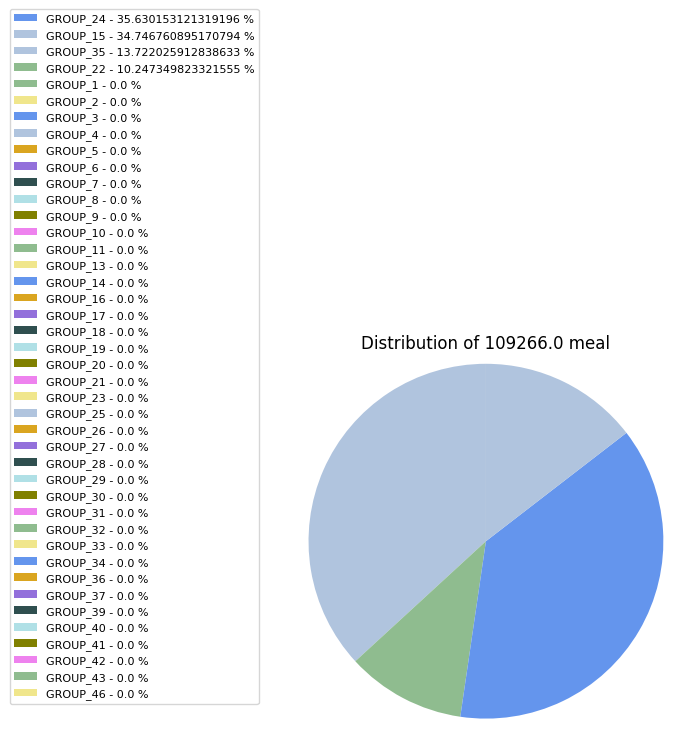

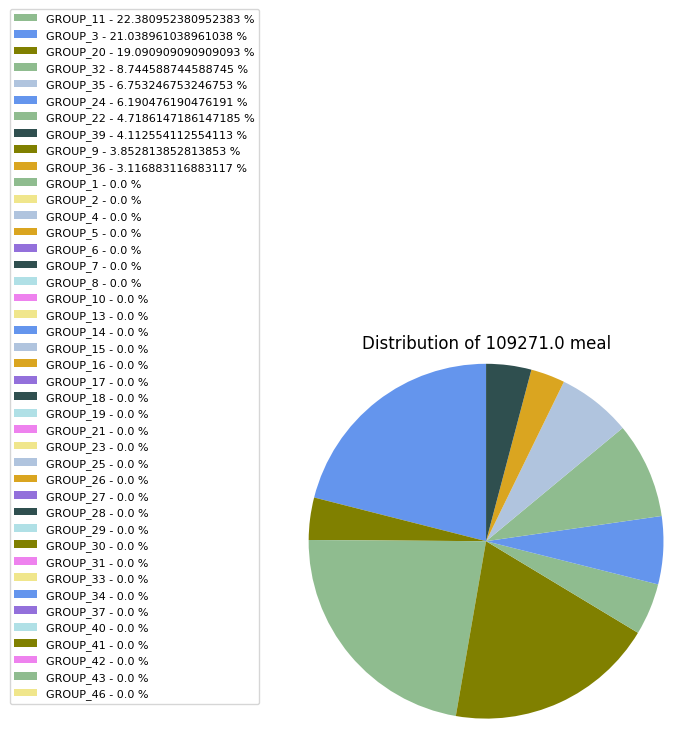

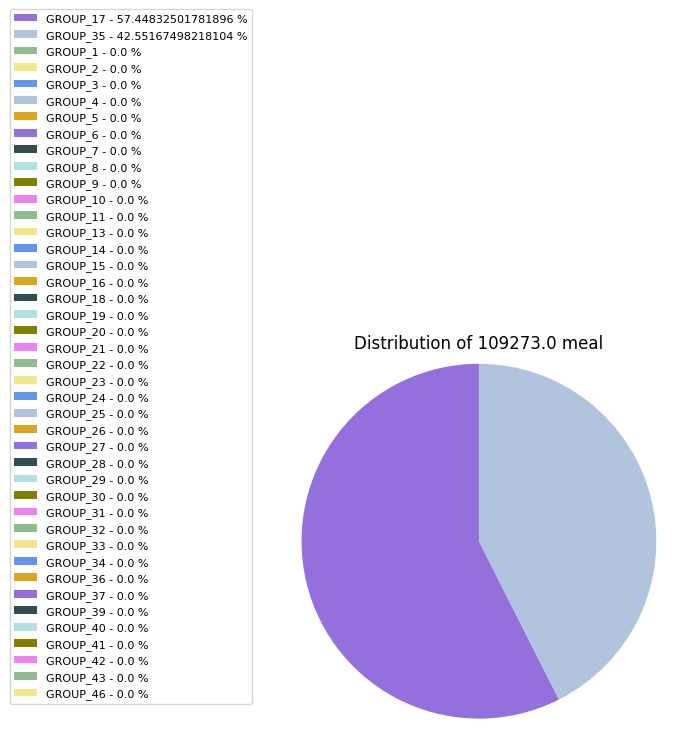

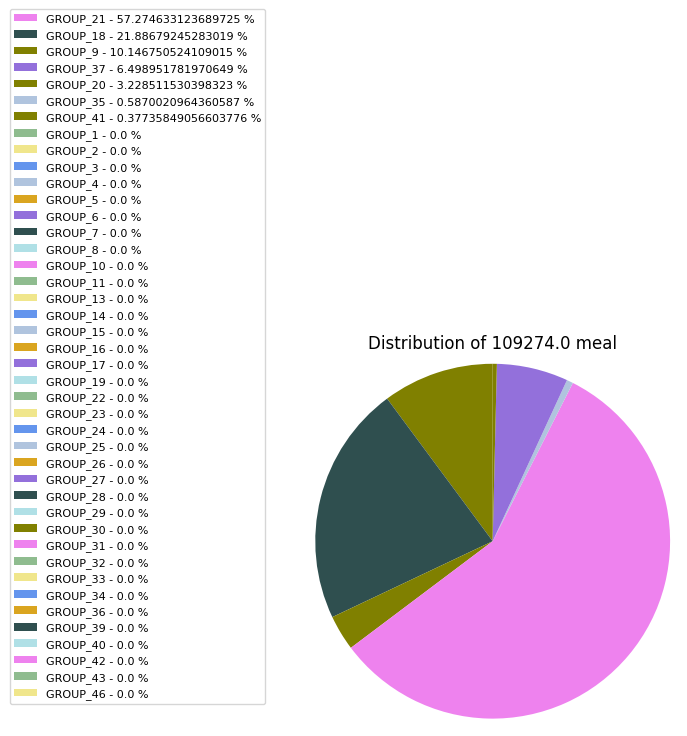

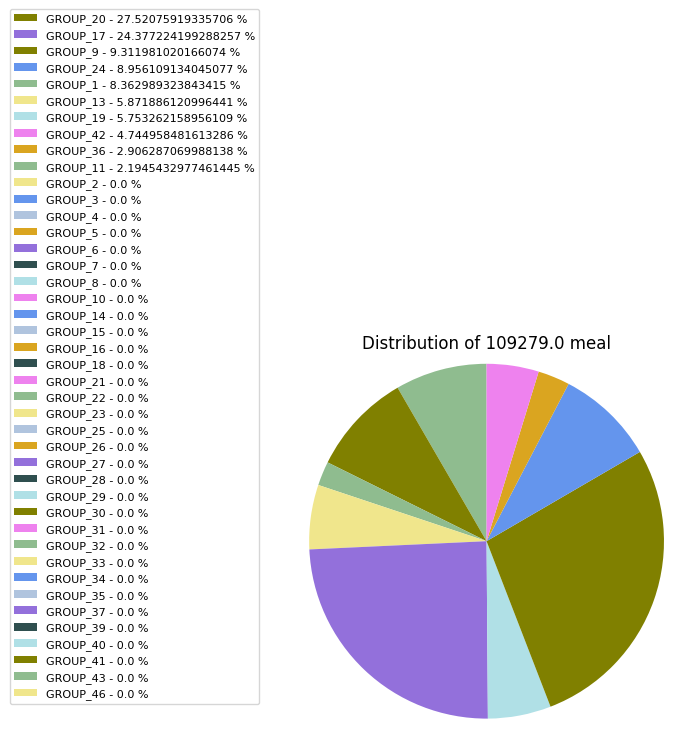

...

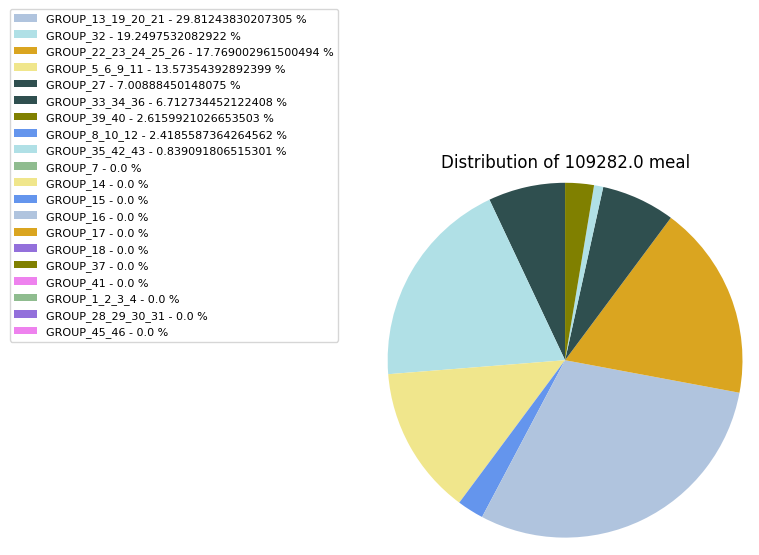

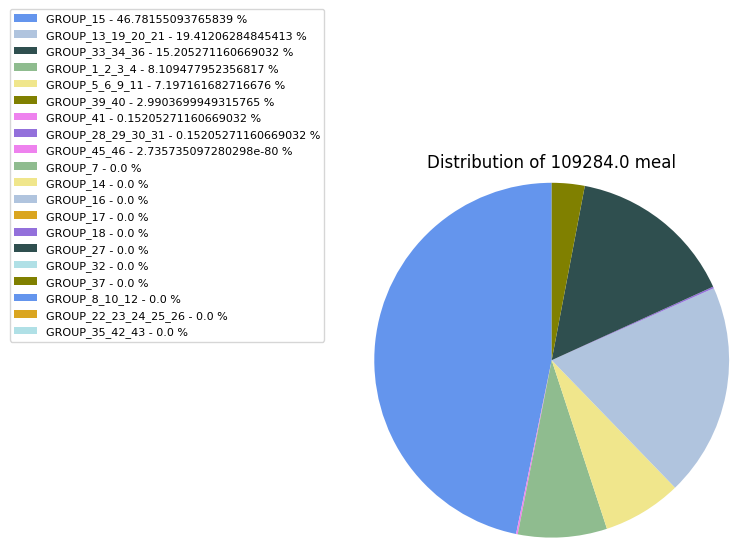

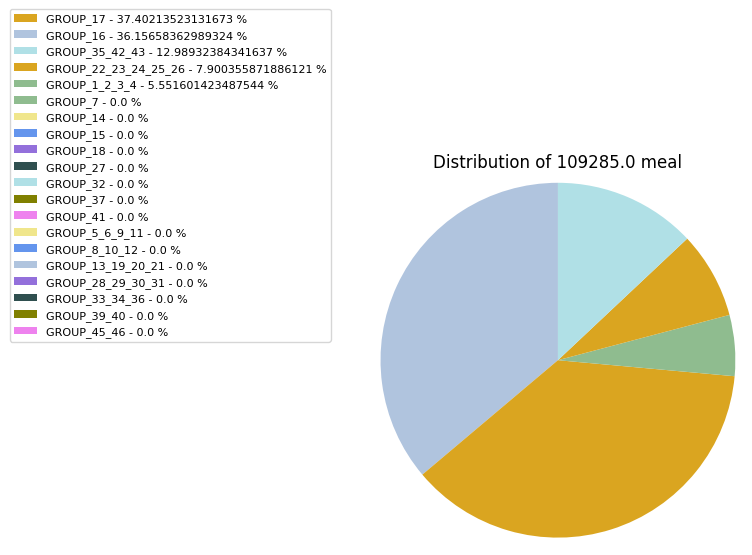

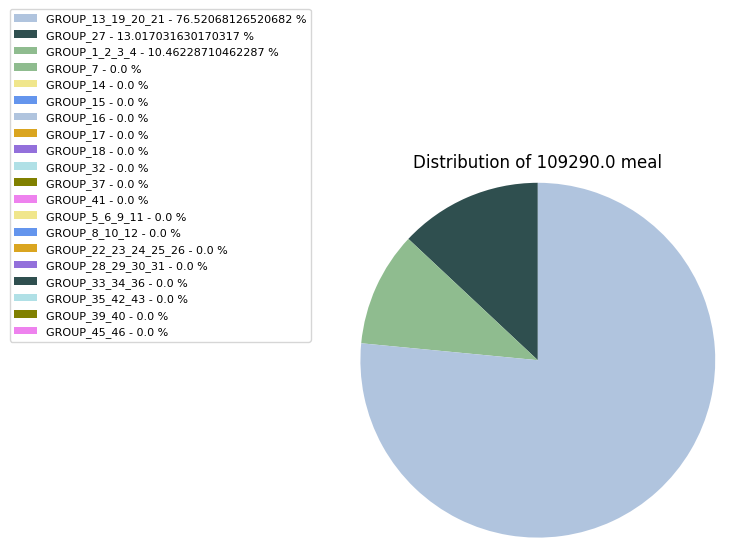

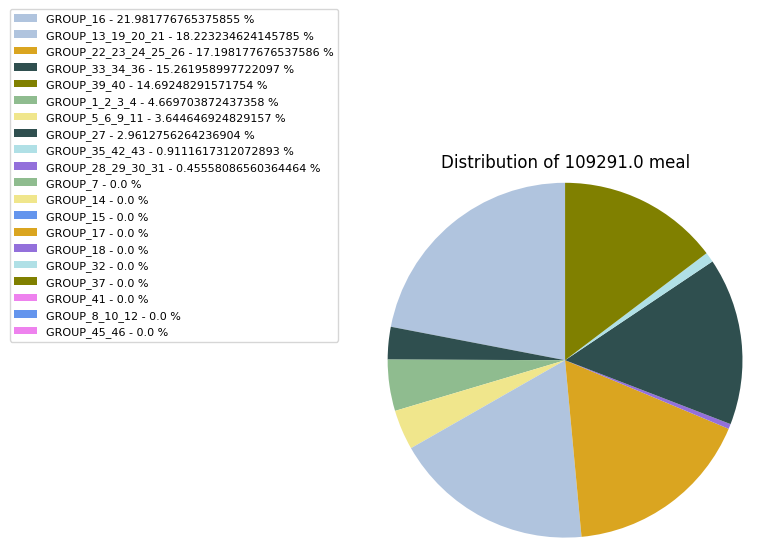

In [ ]:
# examples of food group distribution among first 10 individuals
# categorical data
def meal_distribution(complete_df, pie_chart_columns):
    visualise_data = complete_df[['SEQN'] + pie_chart_columns].head(10)
    rows = visualise_data['SEQN'].to_list()
    for i in rows:
        row = visualise_data[visualise_data['SEQN'] == i]
        x = row.drop(columns = ['SEQN']).columns
        y = np.array(row.drop(columns = ['SEQN']))
        colors_1 = ['darkseagreen','khaki','cornflowerblue','lightsteelblue','goldenrod','mediumpurple', 'darkslategrey','powderblue','olive','violet']
        patches, texts = plt.pie(y[0], colors=colors_1, startangle=90, radius=1.2)
        labels = [f'{i} - {j*100} %'.format(i,j) for i,j in zip(x, y[0])]

        sort_legend = True
        if sort_legend:
            patches, labels, dummy =  zip(*sorted(zip(patches, labels, y[0]),
                                                  key=lambda x: x[2],
                                                  reverse=True))
        plt.legend(patches, labels, loc='center right', bbox_to_anchor=(-0.1, 1.),
                  fontsize=8)
        plt.title(f'Distribution of {i} meal')
        plt.show()

pie_chart_columns_46 = ['GROUP_1', 'GROUP_2', 'GROUP_3',
       'GROUP_4', 'GROUP_5', 'GROUP_6', 'GROUP_7', 'GROUP_8', 'GROUP_9',
       'GROUP_10', 'GROUP_11', 'GROUP_13', 'GROUP_14', 'GROUP_15',
       'GROUP_16', 'GROUP_17', 'GROUP_18', 'GROUP_19', 'GROUP_20', 'GROUP_21',
       'GROUP_22', 'GROUP_23', 'GROUP_24', 'GROUP_25', 'GROUP_26', 'GROUP_27',
       'GROUP_28', 'GROUP_29', 'GROUP_30', 'GROUP_31', 'GROUP_32', 'GROUP_33',
       'GROUP_34', 'GROUP_35', 'GROUP_36', 'GROUP_37', 'GROUP_39',
       'GROUP_40', 'GROUP_41', 'GROUP_42', 'GROUP_43', 'GROUP_46']
pie_chart_columns_22 = ['GROUP_7', 'GROUP_14', 'GROUP_15',
       'GROUP_16', 'GROUP_17', 'GROUP_18', 'GROUP_27', 'GROUP_32', 'GROUP_37',
        'GROUP_41', 'GROUP_1_2_3_4', 'GROUP_5_6_9_11',
       'GROUP_8_10_12', 'GROUP_13_19_20_21', 'GROUP_22_23_24_25_26',
       'GROUP_28_29_30_31', 'GROUP_33_34_36', 'GROUP_35_42_43', 'GROUP_39_40',
       'GROUP_45_46']
meal_distribution(complete_data_46, pie_chart_columns_46)
meal_distribution(complete_data_22, pie_chart_columns_22)

###PCA data preparation###


Axes(0.125,0.11;0.698618x0.77)
Axes(0.125,0.11;0.698618x0.77)
               percentage
TIMEUS          76.432951
EDUCTN          14.196214
MARITALSTS      14.196214
INCOMEPOVERTY   11.503599
Axes(0.125,0.11;0.698618x0.77)
               percentage
TIMEUS          76.432951
EDUCTN          14.196214
MARITALSTS      14.196214
INCOMEPOVERTY   11.503599


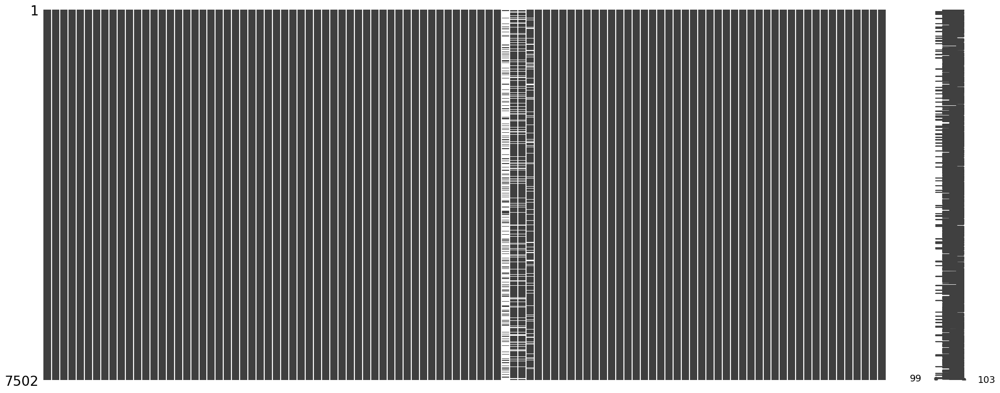

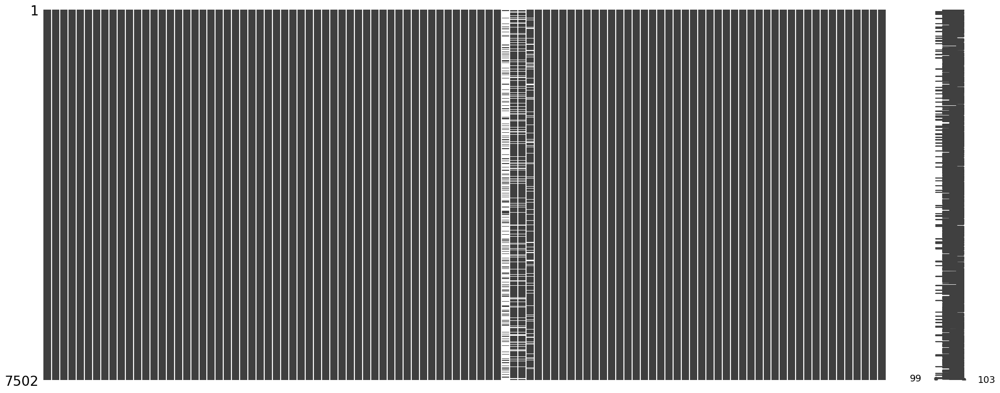

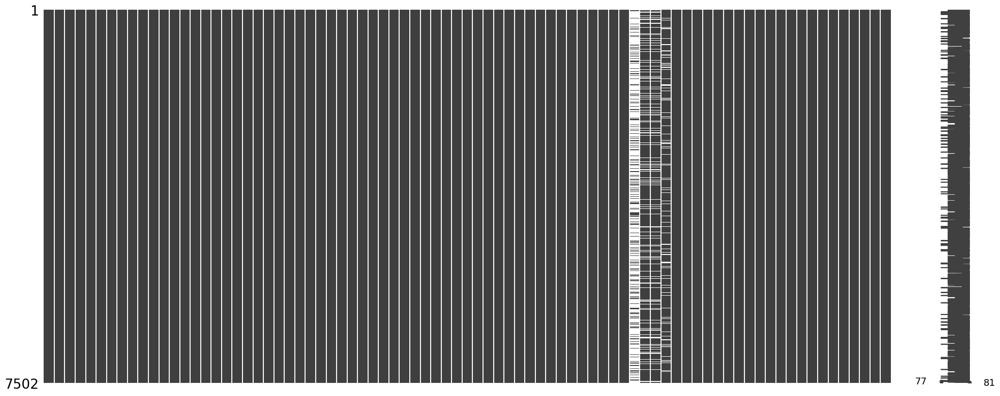

In [ ]:
# how meaningful are columns for pca analysis

print(msno.matrix(complete_data))

def null_values_analysis(data):
    print(msno.matrix(data))
    #  table with percentage of null values
    null=100*(data.isnull().sum())/(data.shape[0])
    df_null=pandas.DataFrame({'percentage':null})
    print(df_null[df_null['percentage'] > 0]) # delete TIMEUS and impute suitable values in EDUCTN, MARITALSTS and INCOMEPOVERTY
    data.drop(columns=['TIMEUS'], inplace=True)
null_values_analysis(complete_data_46)
null_values_analysis(complete_data_22)

In [ ]:

# complete_data_test.head(10)
# # complete_data_test = complete_data_test.drop(columns=['EDUCTN', 'ORGCOUNTRY', 'MARITALSTS'])
# # categorical_data = ['GENDER', 'RACE', 'PERIOD', 'SALTUSE', 'SPECDIET'] as race, period, saltuse and specdiet are represented in number no transformation will be done to data
# # the data will be divided by gender to avoid misclusterisation
# complete_data_test[['SEQN', 'D1SMPLWEIGHT', 'SALTUSE', 'SPECDIET', 'DR1TNUMF', 'DR1TKCAL',
#        'DR1TPROT', 'DR1TCARB', 'DR1TSUGR', 'DR1TFIBE', 'DR1TTFAT', 'DR1TSFAT',
#        'DR1TMFAT', 'DR1TPFAT', 'DR1TCHOL', 'DR1TATOC', 'DR1TATOA', 'DR1TRET',
#        'DR1TVARA', 'DR1TBCAR', 'DR1TVB6', 'DR1TVB12', 'DR1TVC', 'DR1TVD',
#        'DR1TVK', 'DR1TCALC', 'DR1TPHOS', 'DR1TMAGN', 'DR1TIRON', 'DR1TZINC',
#        'DR1TSODI', 'DR1TPOTA', 'DR1TSELE', 'DR1TCAFF', 'DR1TALCO', 'WATERCONS',
#        'GENDR', 'AGE_YR', 'RACE', 'PERIOD', 'INCOMEPOVERTY']].head()

# male_df = complete_data_test[complete_data_test['GENDR'] == 1]
# male_df = male_df.drop(columns=["GENDR"])
# print(f"Male data shape: {male_df.shape}")
# print(male_df.head(10))
# # print(male_df.columns)
# female_df = complete_data_test[complete_data_test['GENDR'] == 2]
# female_df = female_df.drop(columns=["GENDR"])
# print(f"Female data shape: {female_df.shape}")
# print(female_df.head(10))
# # print(female_df.shape)
# # print(female_df.columns)


####Exploratory Data Analysis (EDA)####
To decide on whether males and females should be considered together in indentifying dietary patterns or not we should compare the distribution of dietary variables between males and females visually to identify any significant differences.

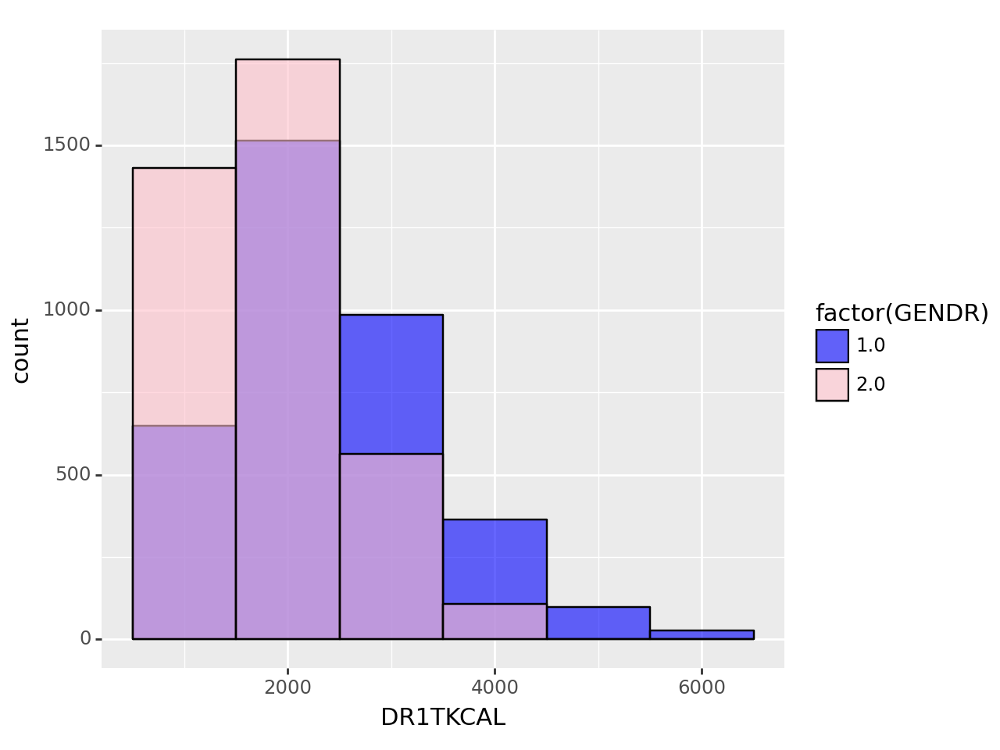

<ipython-input-21-907c9bc329b9>:18: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


<ipython-input-21-907c9bc329b9>:18: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


<ipython-input-21-907c9bc329b9>:18: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


<ipython-input-21-907c9bc329b9>:18: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


<ipython-input-21-907c9bc329b9>:18: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and wi

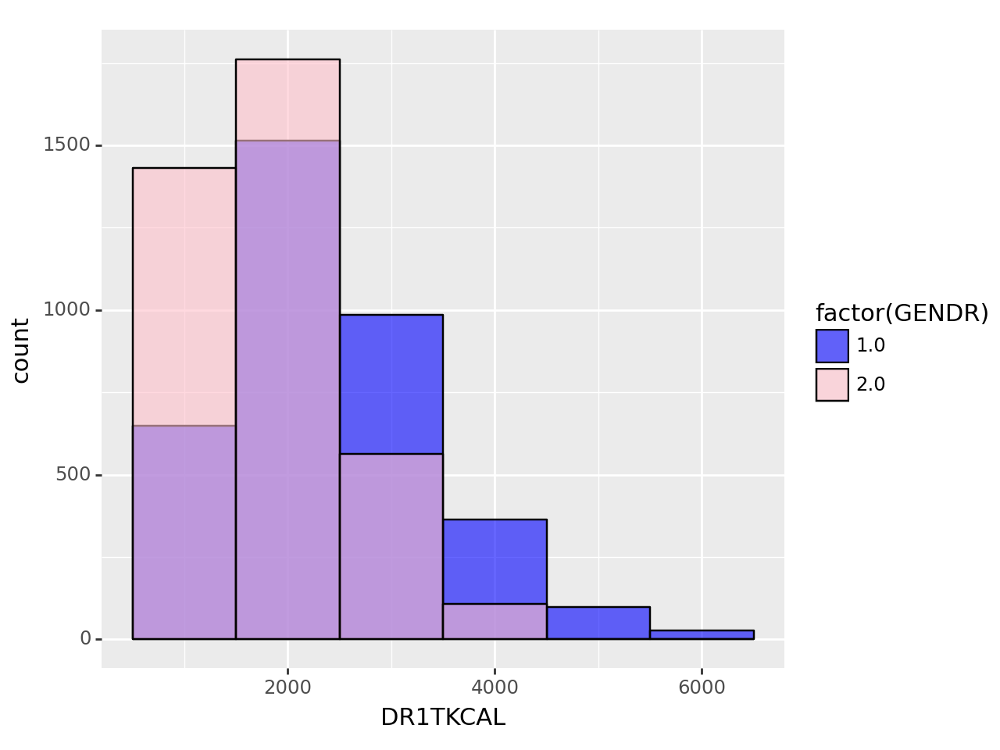

<ipython-input-21-907c9bc329b9>:18: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


<ipython-input-21-907c9bc329b9>:18: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


<ipython-input-21-907c9bc329b9>:18: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


<ipython-input-21-907c9bc329b9>:18: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


<ipython-input-21-907c9bc329b9>:18: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and wi

In [ ]:
def visualization(df):
    plt1 = ggplot(df, aes(x='DR1TKCAL', fill='factor(GENDR)')) + \
          geom_histogram(binwidth=1000, alpha=0.6, color='black', position='identity') + \
          scale_fill_manual(values=["blue", "pink"])
    print(plt1)

    df['GENDER_LABEL'] = df['GENDR'].map({1: 'Male', 2: 'Female'})

    numerical_columns = ['DR1TKCAL', 'DR1TNUMF', 'DR1TKCAL', 'DR1TPROT', 'DR1TCARB', 'DR1TSUGR',
                        'DR1TFIBE', 'DR1TTFAT', 'DR1TSFAT', 'DR1TMFAT', 'DR1TPFAT', 'DR1TCHOL',
                        'DR1TATOC', 'DR1TATOA', 'DR1TRET', 'WATERCONS', 'AGE_YR', 'INCOMEPOVERTY'] + [col for col in df.columns if 'GROUP_' in col]


    fig, axes = plt.subplots((len(numerical_columns)//4)+1, 4, figsize=(18, 72))


    for i, column_name in enumerate(numerical_columns):
        sns.violinplot(ax=axes[i//4, i%4], data=df, x='GENDER_LABEL', y=column_name, palette={"Male": "skyblue", "Female": "pink"})
        # Add mean and median markers for each gender
        for gender_label, color in zip(df['GENDER_LABEL'].unique(), ['blue', 'green']):
            gender_data = df[df['GENDER_LABEL'] == gender_label][column_name]
            axes[i//4, i%4].axhline(y=gender_data.mean(), color=color, linestyle='--', label=f'Mean ({gender_label})')
            axes[i//4, i%4].axhline(y=gender_data.median(), color=color, linestyle='-.', label=f'Median ({gender_label})')

        # Set labels and title for each subplot
        axes[i//4, i%4].set_xlabel('Gender')
        axes[i//4, i%4].set_ylabel(column_name)
        axes[i//4, i%4].set_title(f'Violin plot for {column_name}')

    plt.tight_layout()

    plt.show()


visualization(complete_data_46)
visualization(complete_data_22)


Based on the provided violin plot and the goal of identifying dietary patterns among the population:

- There isn't strong evidence suggesting that dietary patterns significantly differ between genders based solely on the distribution of total grams consumed.
Difference in Central Tendency:
- While there may be some difference in the average total grams consumed between genders, the magnitude of this difference is relatively small.

In [ ]:
from scipy.stats import ranksums
import pprint
def wilcoxon_test(data):
    diff_dist = {}
    numerical_columns = ['DR1TKCAL', 'DR1TNUMF', 'DR1TKCAL', 'DR1TPROT', 'DR1TCARB', 'DR1TSUGR', 'DR1TFIBE', 'DR1TTFAT', 'DR1TSFAT', 'DR1TMFAT', 'DR1TPFAT',
    'DR1TCHOL', 'DR1TATOC', 'DR1TATOA', 'DR1TRET', 'WATERCONS', 'AGE_YR', 'INCOMEPOVERTY'] + [col for col in data.columns if 'GROUP_' in col]
    for col in numerical_columns:
        male_values = data.loc[data['GENDR'] == 1, col]
        female_values = data.loc[data['GENDR'] == 2, col]
        stat, p_val = ranksums(male_values, female_values)
        print(f"Wilcoxon rank sum test for {col}:")
        print("Wilcoxon rank sum test statistic:", stat)
        if p_val > 0.05:
            print('p-value: ', end='')
            print('\033[91m' + str(p_val) + '\033[0m')
            diff_dist[col] = p_val
        else:
            print("p-value:", "{:.2f}".format(p_val))
        print()
    print(f"Number of variables: {len(numerical_columns)}\nNumber of significant differences: {len(diff_dist.keys())}\n")
    return diff_dist

print('46 Food Groups')
different_var_dists_46 = wilcoxon_test(complete_data_46)
pprint.pp(different_var_dists_46)
print()
print('22 Food Groups')
different_var_dists_22 = wilcoxon_test(complete_data_22)
pprint.pp(different_var_dists_22)

46 Food Groups
Wilcoxon rank sum test for DR1TKCAL:
Wilcoxon rank sum test statistic: 26.68371874755999
p-value: 0.00

Wilcoxon rank sum test for DR1TNUMF:
Wilcoxon rank sum test statistic: -2.8530537022172155
p-value: 0.00

Wilcoxon rank sum test for DR1TKCAL:
Wilcoxon rank sum test statistic: 26.68371874755999
p-value: 0.00

Wilcoxon rank sum test for DR1TPROT:
Wilcoxon rank sum test statistic: 25.97422863819284
p-value: 0.00

Wilcoxon rank sum test for DR1TCARB:
Wilcoxon rank sum test statistic: 21.435198597154596
p-value: 0.00

Wilcoxon rank sum test for DR1TSUGR:
Wilcoxon rank sum test statistic: 12.677067727966978
p-value: 0.00

Wilcoxon rank sum test for DR1TFIBE:
Wilcoxon rank sum test statistic: 11.735562672889847
p-value: 0.00

Wilcoxon rank sum test for DR1TTFAT:
Wilcoxon rank sum test statistic: 20.021450354645882
p-value: 0.00

Wilcoxon rank sum test for DR1TSFAT:
Wilcoxon rank sum test statistic: 18.812570514536024
p-value: 0.00

Wilcoxon rank sum test for DR1TMFAT:
Wilco

####Futher data preprocessing####

In [ ]:


complete_data_46.drop(columns=['GENDER_LABEL'], inplace=True)
complete_data_22.drop(columns=['GENDER_LABEL'], inplace=True)

def scaling_and_imputation(complete_data):
    # Data Standardisation
    scaler = StandardScaler()
    scaled_data = scaler.fit_transform(complete_data.drop(columns=['SEQN']))
    seqns_to_insert = complete_data['SEQN'].values
    combined_array = np.insert(scaled_data, 0, seqns_to_insert, axis=1)
    print(combined_array)
    scaled_df = pandas.DataFrame(combined_array, index=complete_data.index, columns=complete_data.columns)
    print(scaled_df.head())

    # KNN imputation of incompoverty rate
    # Define scaler to set values between 0 and 1
    scaler = MinMaxScaler(feature_range=(0, 1))
    df_knn= pandas.DataFrame(scaler.fit_transform(scaled_df), columns = scaled_df.columns)

    # Define KNN imputer and fill missing values
    knn_imputer = KNNImputer(n_neighbors=5, weights='uniform', metric='nan_euclidean')
    df_knn_imputed = pandas.DataFrame(knn_imputer.fit_transform(df_knn), columns=df_knn.columns)

    # Converting the dataset to its original form after scaling
    original_data = scaler.inverse_transform(df_knn_imputed)

    # # Convert the original data to a DataFrame
    df_original = pandas.DataFrame(original_data, columns=df_knn.columns)
    print(df_original.head(10))
    return df_original
df_original_46 = scaling_and_imputation(complete_data_46)
df_original_46_m = scaling_and_imputation(complete_data_46[complete_data_46['GENDR']==1])
df_original_46_m.drop(columns=['GENDR'], inplace=True)
df_original_46_f = scaling_and_imputation(complete_data_46[complete_data_46['GENDR']==2])
df_original_46_f.drop(columns=['GENDR'], inplace=True)
df_original_22 = scaling_and_imputation(complete_data_22)
df_original_22_m = scaling_and_imputation(complete_data_22[complete_data_22['GENDR']==1])
df_original_22_m.drop(columns=['GENDR'], inplace=True)
df_original_22_f = scaling_and_imputation(complete_data_22[complete_data_22['GENDR']==2])
df_original_22_f.drop(columns=['GENDR'], inplace=True)

[[ 1.09266000e+05 -5.95102919e-01  7.89330504e-01 ... -3.72948742e-01
  -1.67546199e-01 -1.78147394e-01]
 [ 1.09271000e+05 -3.66648313e-01 -1.85304230e+00 ... -3.72948742e-01
  -1.67546199e-01 -1.78147394e-01]
 [ 1.09273000e+05  2.91457467e-01 -9.72251362e-01 ... -3.72948742e-01
  -1.67546199e-01 -1.78147394e-01]
 ...
 [ 1.24814000e+05 -6.88896615e-01 -9.14604288e-02 ... -3.72948742e-01
  -1.67546199e-01 -1.78147394e-01]
 [ 1.24815000e+05  6.71950727e-01 -1.85304230e+00 ... -3.72948742e-01
  -1.67546199e-01 -1.78147394e-01]
 [ 1.24818000e+05 -3.68350844e-01 -9.14604288e-02 ... -3.72948742e-01
  -1.67546199e-01 -1.78147394e-01]]
       SEQN  D1SMPLWEIGHT   SALTUSE  SPECDIET  DR1TNUMF  DR1TKCAL  DR1TPROT  \
0  109266.0     -0.595103  0.789331 -2.227338 -1.208098 -0.449023 -0.644816   
1  109271.0     -0.366648 -1.853042  0.425383 -0.531655  0.223704  0.818905   
2  109273.0      0.291457 -0.972251  0.425383 -1.884542 -0.773296 -0.540156   
3  109274.0     -0.451578 -0.972251  0.425383 -1

In [ ]:
# how columns correlate
def absHighPass(df, absThresh):
    passed = set()
    for (r,c) in combinations(df.columns, 2):
        if (abs(df.loc[r,c]) >= absThresh) and (abs(df.loc[r,c]) != 1):
            passed.add(r)
            passed.add(c)
    passed = sorted(passed)
    print(len(passed))
    return df.loc[passed,passed]


corrDf_46 = df_original_46.corr()
corrDf_22 = df_original_22.corr()
# heatmap(absHighPass(corrDf_46,0.5))
# show()
# heatmap(absHighPass(corrDf_22,0.5))
# show()

corr_5_46 = absHighPass(corrDf_46,0.5)
corr_5_22 = absHighPass(corrDf_22,0.5)

import plotly.graph_objects as go
from plotly.subplots import make_subplots

# Create subplots with 1 row and 2 columns
fig = make_subplots(rows=1, cols=2,subplot_titles=("46 food groups", "22 food groups"))

fig.add_trace(go.Heatmap(z=corr_5_46, x=corr_5_46.columns, y=corr_5_46.index,  coloraxis="coloraxis"), row=1, col=1)
fig.add_trace(go.Heatmap(z=corr_5_22, x=corr_5_22.columns, y=corr_5_22.index, coloraxis="coloraxis"), row=1, col=2)

# Update layout for the figure
fig.update_layout(title_text="Correlation Heatmaps", title_x=0.5, coloraxis=dict(colorscale='rdbu'), showlegend=False)

# Show the figure
fig.show()



44
41


In [ ]:
def significant_correlations(corrDf):
    for i in range(len(corrDf.columns)):
        for j in range(i+1, len(corrDf.columns)):
            # Check if the correlation is greater than 0.5 but smaller than 1
            if abs(corrDf.iloc[i, j]) > 0.5 and abs(corrDf.iloc[i, j]) < 1:
                print(f"{corrDf.columns[i]} and {corrDf.columns[j]}: {corrDf.iloc[i, j]}")
significant_correlations(corrDf_46)
significant_correlations(corrDf_22)

DR1TKCAL and DR1TPROT: 0.7545770360577753
DR1TKCAL and DR1TCARB: 0.8557683199970272
DR1TKCAL and DR1TSUGR: 0.6399412872800517
DR1TKCAL and DR1TFIBE: 0.5133573500616342
DR1TKCAL and DR1TTFAT: 0.8699517661486694
DR1TKCAL and DR1TSFAT: 0.8007936317177738
DR1TKCAL and DR1TMFAT: 0.8183403105411271
DR1TKCAL and DR1TPFAT: 0.6955246537562333
DR1TKCAL and DR1TATOC: 0.5262217049508946
DR1TKCAL and DR1TVB1: 0.648089299377029
DR1TKCAL and DR1TVB2: 0.6004331287209255
DR1TKCAL and DR1TNIAC: 0.6269295899464487
DR1TKCAL and DR1TFOLA: 0.5686770959601282
DR1TKCAL and DR1TFF: 0.5054619649091564
DR1TKCAL and DR1TFDFE: 0.5232918930282805
DR1TKCAL and DR1TCHL: 0.6288836445065308
DR1TKCAL and DR1TCALC: 0.5836015095320052
DR1TKCAL and DR1TPHOS: 0.805651573331496
DR1TKCAL and DR1TMAGN: 0.652642248055062
DR1TKCAL and DR1TIRON: 0.6123798199371444
DR1TKCAL and DR1TZINC: 0.6141741768769007
DR1TKCAL and DR1TSODI: 0.7871164519944179
DR1TKCAL and DR1TPOTA: 0.6815228664111268
DR1TKCAL and DR1TSELE: 0.6864222670897403


In [ ]:
# https://towardsdatascience.com/pca-102-should-you-use-pca-how-many-components-to-use-how-to-interpret-them-da0c8e3b11f0
def psi_index(X, normalize=False):
    corr = np.corrcoef(X, rowvar=False)
    print(f"Maximum PSI index value: {X.shape[1]*(X.shape[1]-1)}")

    eig_val, eig_vec = np.linalg.eig(corr)
    idx = eig_val.argsort()[::-1]
    eig_val = eig_val[idx]
    if normalize:
        p = X.shape[0]
        return np.sum((eig_val - 1)**2) / (p*(p-1))
    else:
        return np.sum((eig_val - 1)**2)

def scatter_coefficient(X, normalize=True):
    corr = np.corrcoef(X, rowvar=False)
    if normalize:
        return np.linalg.det(corr) / np.trace(corr)
    else:
        return np.linalg.det(corr)
print(f"Psi index 46: {psi_index(df_original_46.drop(columns=['SEQN']))}")
print(f"Scatter coef 46: {scatter_coefficient(df_original_46.drop(columns=['SEQN']))}")
print()

print(f"Psi index 46 m: {psi_index(df_original_46_m.drop(columns=['SEQN']))}")
print(f"Scatter coef 46 m: {scatter_coefficient(df_original_46_m.drop(columns=['SEQN']))}")
print()

print(f"Psi index 46 f: {psi_index(df_original_46_f.drop(columns=['SEQN']))}")
print(f"Scatter coef 46 f: {scatter_coefficient(df_original_46_f.drop(columns=['SEQN']))}")
print()

print(f"Psi index 22: {psi_index(df_original_22.drop(columns=['SEQN']))}")
print(f"Scatter coef 22: {scatter_coefficient(df_original_22.drop(columns=['SEQN']))}")
print()

print(f"Psi index 22 m: {psi_index(df_original_22_m.drop(columns=['SEQN']))}")
print(f"Scatter coef 22 m: {scatter_coefficient(df_original_22_m.drop(columns=['SEQN']))}")
print()

print(f"Psi index 22 f: {psi_index(df_original_22_f.drop(columns=['SEQN']))}")
print(f"Scatter coef 22 f: {scatter_coefficient(df_original_22_f.drop(columns=['SEQN']))}")
print()

Maximum PSI index value: 10100
Psi index 46: 318.59923909535206
Scatter coef 46: 4.622725018640153e-47

Maximum PSI index value: 9900
Psi index 46 m: 302.7006902926556
Scatter coef 46 m: 2.484645326358688e-47

Maximum PSI index value: 9900
Psi index 46 f: 298.04977741208603
Scatter coef 46 f: 1.0038246296704665e-46

Maximum PSI index value: 6162
Psi index 22: 309.25876638491417
Scatter coef 22: -1.1219281290947605e-58

Maximum PSI index value: 6006
Psi index 22 m: 292.48211542529816
Scatter coef 22 m: -7.246415903042224e-59

Maximum PSI index value: 6006
Psi index 22 f: 287.75950804788437
Scatter coef 22 f: 5.320497625650644e-57




####Covariance matrix####
Computing the covariance matrix is a crucial step in PCA because it helps us understand how different variables in our dataset vary together. The covariance matrix provides information about the relationships between pairs of variables and is used to calculate the principal components.

In [ ]:
print(df_original_46.shape)
print('Female')
print((df_original_46[df_original_46["GENDR"] == df_original_46["GENDR"].unique()[0]]).shape)
print('Male')
print((df_original_46[df_original_46["GENDR"] == df_original_46["GENDR"].unique()[1]]).shape)

(7502, 102)
Female
(3865, 102)
Male
(3637, 102)


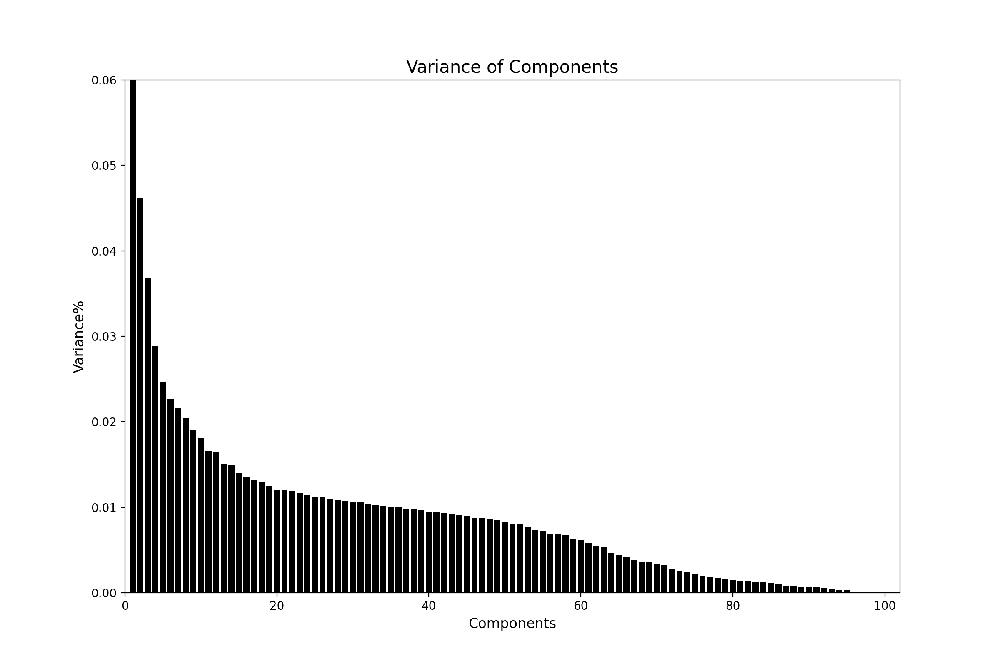

0.2515402210629166
Number of features to explain 95% of variance: 66/101
[0.16862499 0.04615136 0.03676388]
Explained variance of >= .03 PCs: 0.2515402210629166
3


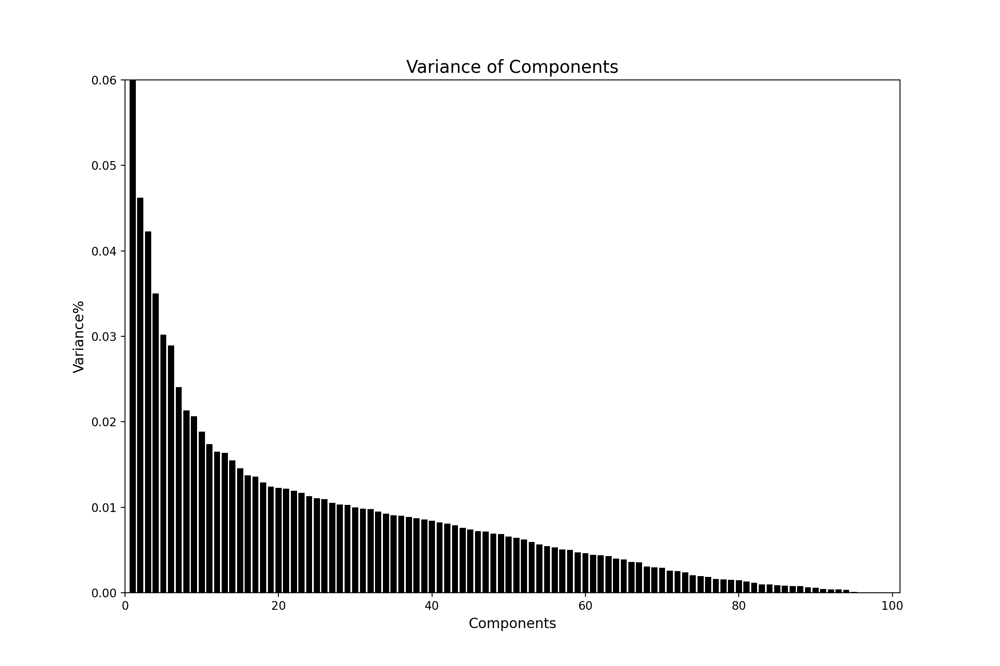

0.27875193543133236
Number of features to explain 95% of variance: 65/100
[0.1902376  0.0462402  0.04227413 0.03502763 0.03021056]
Explained variance of >= .03 PCs: 0.34399012138642454
5


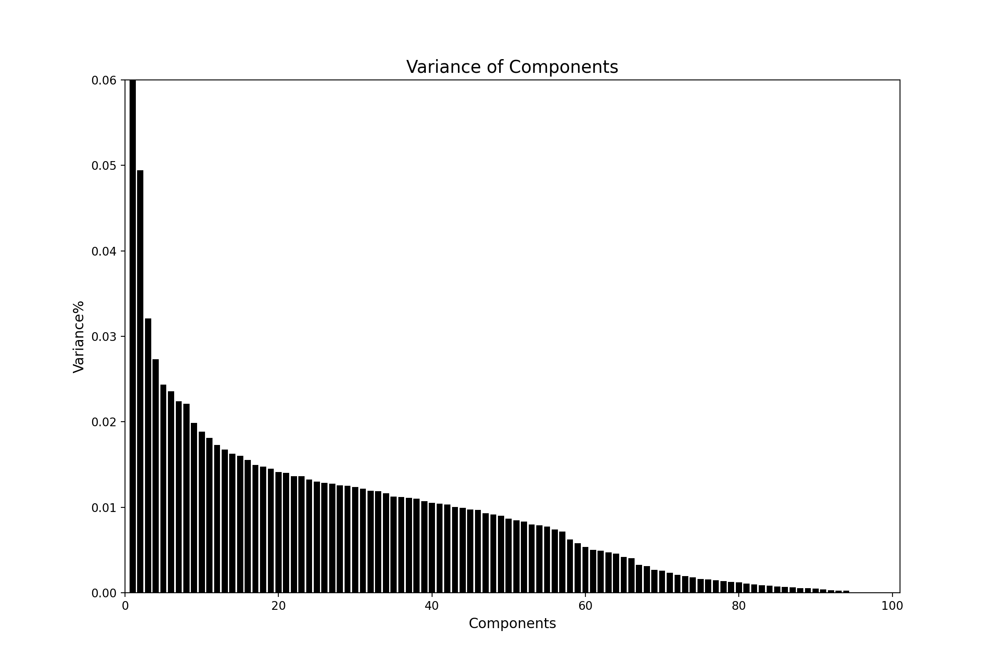

0.20617593583946256
Number of features to explain 95% of variance: 63/100
[0.1246618  0.04943621 0.03207793]
Explained variance of >= .03 PCs: 0.20617593583946256
3


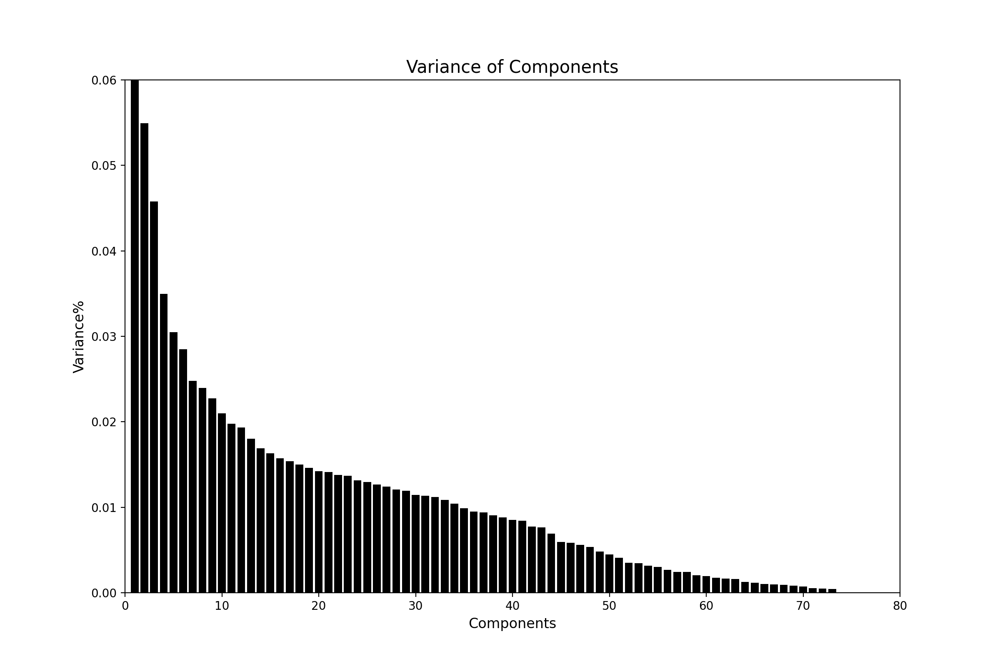

0.3162472292864931
Number of features to explain 95% of variance: 49/79
[0.2155141  0.05493855 0.04579458 0.03494926 0.03050845]
Explained variance of >= .03 PCs: 0.3817049340651434
5


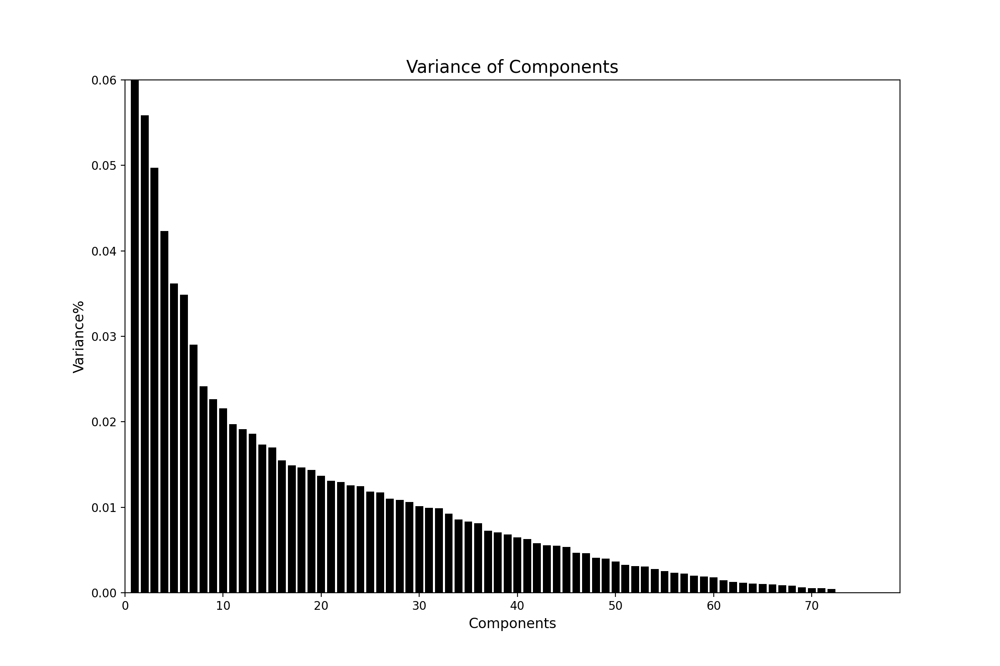

0.33982482980569106
Number of features to explain 95% of variance: 47/78
[0.23422824 0.05586412 0.04973246 0.04233199 0.03616654 0.03485713]
Explained variance of >= .03 PCs: 0.45318049431399965
6


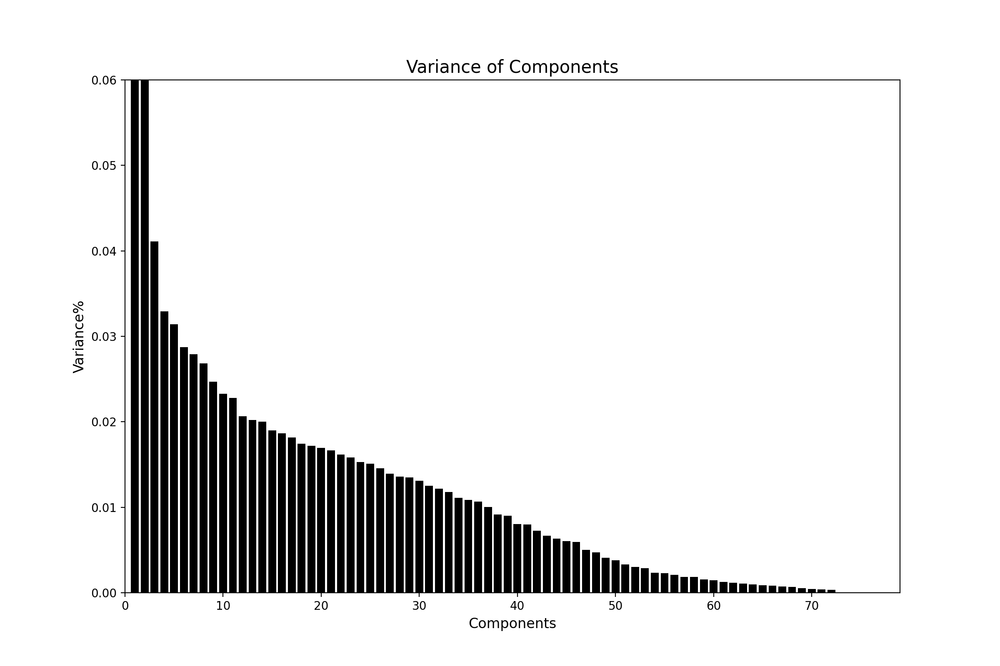

0.27033920876021655
Number of features to explain 95% of variance: 46/78
[0.16844876 0.06079519 0.04109526 0.0329251  0.03138809]
Explained variance of >= .03 PCs: 0.3346523923985338
5


In [ ]:

def components_variance(df_original):
    pca=PCA()
    pca.fit(df_original.drop(columns=['SEQN']))
    explained_variance_ratio = pca.explained_variance_ratio_
    plt.figure(figsize=(12,8))
    plt.bar(x=list(range(1,df_original.shape[1])), height=explained_variance_ratio,color='black')
    plt.xlabel('Components',fontsize=12)
    plt.ylim(0,0.06)
    plt.xlim(0,df_original.shape[1])
    plt.ylabel('Variance%',fontsize=12)
    plt.title('Variance of Components',fontsize=15)
    plt.show()
    print(explained_variance_ratio[:3].sum())
    cumulative_variance = np.cumsum(explained_variance_ratio)
    print(f"Number of features to explain 95% of variance: {np.argmax(cumulative_variance >= 0.95) + 1}/{df_original.drop(columns=['SEQN']).shape[1]}")
    explnd_ratio_03 = np.sum(explained_variance_ratio > 0.03)
    print(explained_variance_ratio[:explnd_ratio_03])
    print(f"Explained variance of >= .03 PCs: {explained_variance_ratio[:explnd_ratio_03].sum()}")
    return pca, explnd_ratio_03


pca_46, pcs_n_46 = components_variance(df_original_46)
print(pcs_n_46)

df_original_46_m = df_original_46[df_original_46["GENDR"] == df_original_46["GENDR"].unique()[1]]
df_original_46_m = df_original_46_m.drop(columns="GENDR")
pca_46_m, pcs_n_46_m = components_variance(df_original_46_m)
print(pcs_n_46_m)

df_original_46_f = df_original_46[df_original_46["GENDR"] == df_original_46["GENDR"].unique()[0]]
df_original_46_f = df_original_46_f.drop(columns="GENDR")
pca_46_f, pcs_n_46_f = components_variance(df_original_46_f)
print(pcs_n_46_f)

pca_22, pcs_n_22 = components_variance(df_original_22)
print(pcs_n_22)

df_original_22_m = df_original_22[df_original_22["GENDR"] == df_original_22["GENDR"].unique()[1]]
df_original_22_m = df_original_22_m.drop(columns="GENDR")
pca_22_m, pcs_n_22_m = components_variance(df_original_22_m)
print(pcs_n_22_m)

df_original_22_f = df_original_22[df_original_22["GENDR"] == df_original_22["GENDR"].unique()[0]]
df_original_22_f = df_original_22_f.drop(columns="GENDR")
pca_22_f, pcs_n_22_f = components_variance(df_original_22_f)
print(pcs_n_22_f)

In [ ]:
def important_features(pca, n_pcs, complete_data):
    initial_feature_names = complete_data.drop(columns=['SEQN']).columns
    top_7_indices = np.argsort(pca.explained_variance_ratio_)[::-1][:n_pcs]
    most_important_indices = np.argsort(np.abs(pca.components_), axis=1)
    most_important_indices = np.argsort(np.abs(pca.components_), axis=1)[:, ::-1][:, :7]
    most_important_names = [
        [initial_feature_names[idx] for idx in pc_indices] for pc_indices in most_important_indices[top_7_indices]
    ]
    df = pandas.DataFrame({'PC{}'.format(i+1): pc_names for i, pc_names in enumerate(most_important_names)})
    print(df)
print('pca_46')
important_features(pca_46, pcs_n_46, df_original_46)
print('\npca_46_m')
important_features(pca_46_m, pcs_n_46_m, df_original_46_m)
print('\npca_46_f')
important_features(pca_46_f, pcs_n_46_f, df_original_46_f)
print('\npca_22')
important_features(pca_22, pcs_n_22, df_original_22)
print('\npca_22_m')
important_features(pca_22_m, pcs_n_22_m, df_original_22_m)
print('\npca_22_f')
important_features(pca_22_f, pcs_n_22_f, df_original_22_f)

pca_46
        PC1       PC2       PC3
0  DR1TPHOS  DR1TBCAR    DR1TFA
1  DR1TKCAL    DR1TLZ  DR1TFDFE
2  DR1TPROT    DR1TVK  DR1TB12A
3  DR1TPOTA  GROUP_28  DR1TMFAT
4  DR1TMAGN    DR1TVC  DR1TCHOL
5  DR1TTFAT    DR1TFF  DR1TPFAT
6   DR1TVB1  GROUP_27  DR1TTFAT

pca_46_m
        PC1       PC2       PC3       PC4       PC5
0  DR1TPHOS  DR1TB12A    DR1TLZ  DR1TALCO  DR1TALCO
1  DR1TKCAL    DR1TFA  DR1TBCAR  GROUP_37  GROUP_37
2  DR1TPROT  DR1TVB12  DR1TSFAT   DR1TVB6   DR1TRET
3   DR1TVB1   DR1TVB6  DR1TFIBE  DR1TCARB    DR1TVD
4   DR1TVB2  DR1TFDFE    DR1TVK  DR1TVB12  DR1TVARA
5  DR1TPOTA  DR1TPFAT    DR1TVC  DR1TB12A  DR1TLYCO
6  DR1TMAGN    DR1TVK  DR1TTFAT  DR1TSUGR  DR1TVB12

pca_46_f
        PC1       PC2       PC3
0  DR1TPOTA  DR1TBCAR    DR1TFA
1  DR1TMAGN    DR1TLZ  DR1TCHOL
2  DR1TPHOS    DR1TVK  DR1TPFAT
3  DR1TKCAL  GROUP_28  GROUP_40
4  DR1TFIBE  GROUP_30  DR1TFDFE
5    DR1TFF  GROUP_27  GROUP_21
6  DR1TPROT  DR1TACAR  DR1TTFAT

pca_22
        PC1                PC2       

In [ ]:


def extract_factor_loadings(pca, features):
    loadings = pca.components_
    component_names = [f"PC{i+1}" for i in range(loadings.shape[0])]
    loadings_df = pandas.DataFrame(loadings.T, index=features, columns=component_names)
    return loadings_df

def important_features_2(pca, n_pcs, df):
    features_names = df.drop(columns=['SEQN']).columns
    loadings_df = extract_factor_loadings(pca, features_names)
    for i in range(n_pcs):
        print(f"PC{i+1}")
        # loading factor >= 0.15
        significant_loadings = loadings_df[np.abs(loadings_df[f"PC{i+1}"]) >= 0.10][f"PC{i+1}"]
        print(significant_loadings[significant_loadings.index.str.contains("GROUP_")])
        sorted_indices = np.argsort(np.abs(loadings_df[f"PC{i+1}"]))[::-1]
        # print(sorted_indices)
        for j in sorted_indices:
            pass
            # print(f"  Feature: {features_names[j]} \t Loadings: {loadings_df[f'PC{i+1}'][features_names[j]]}")
        print()

# important_features(pca_46, 2, df_original_46)
print('46 groups')
important_features_2(pca_46, pcs_n_46, df_original_46)


important_features_2(pca_46_m, pcs_n_46_m, df_original_46_m)


important_features_2(pca_46_f, pcs_n_46_f, df_original_46_f)

# important_features(pca_22, 3, df_original_22)
print('\n22 groups\n')
important_features_2(pca_22, pcs_n_22, df_original_22)
# important_features(pca_22_f, 3, df_original_22_f)
important_features_2(pca_22_m, pcs_n_22_m, df_original_22_m)
# important_features(pca_22_m, 3, df_original_22_m)
important_features_2(pca_22_f, pcs_n_22_f, df_original_22_f)

# important_features(pca_46_narrow, 2, df_narrow_46) # poor interpretable
# important_features(pca_22_narrow, 2, df_narrow_22)
# important_features(pca_narrow, 3, df_narrow)
# important_features(pca_narrow_foods, 3, df_foods_only)

46 groups
PC1
Series([], Name: PC1, dtype: float64)

PC2
GROUP_10    0.128670
GROUP_17   -0.113207
GROUP_27    0.197184
GROUP_28    0.227113
GROUP_29    0.120565
GROUP_30    0.185567
GROUP_31    0.127467
Name: PC2, dtype: float64

PC3
GROUP_1     0.154453
GROUP_6    -0.100607
GROUP_8    -0.130638
GROUP_21    0.185935
Name: PC3, dtype: float64

PC1
Series([], Name: PC1, dtype: float64)

PC2
GROUP_1     0.112926
GROUP_10   -0.106467
GROUP_16    0.118676
GROUP_21    0.112336
GROUP_35    0.109363
Name: PC2, dtype: float64

PC3
GROUP_10    0.106977
GROUP_17   -0.113384
GROUP_19    0.122954
GROUP_21    0.101983
GROUP_27    0.183178
GROUP_28    0.151305
Name: PC3, dtype: float64

PC4
GROUP_5     0.150697
GROUP_8     0.125218
GROUP_16   -0.101862
GROUP_24   -0.152285
GROUP_37    0.310071
Name: PC4, dtype: float64

PC5
GROUP_1     0.161034
GROUP_2     0.108978
GROUP_8     0.150129
GROUP_9     0.104742
GROUP_16   -0.105143
GROUP_37   -0.374858
Name: PC5, dtype: float64

PC1
Series([], Name: PC1,

In [ ]:

def run_pca(n_cmpts, df):
    pca=PCA(n_components=n_cmpts)
    pca.fit(df.drop(columns=['SEQN']))
    X_pca=pca.transform(df.drop(columns=['SEQN']))
    if n_cmpts == 2:
      fig = px.scatter(x=X_pca[:, 0], y=X_pca[:, 1])
      fig.update_layout(
          title={
              'text': 'First vs. Second Principal Components',
              'y': 0.92,
              'x': 0.5,
              'xanchor': 'center',
              'yanchor': 'top'})
      fig.show()
    if n_cmpts == 3:
      fig=px.scatter_3d(x=X_pca[:,0],y=X_pca[:,1],z=X_pca[:,2])
      fig.update_layout(
          title={
              'text': 'First vs. Second vs. Third Principal Components',
              'y':0.92,
              'x':0.5,
              'xanchor': 'center',
              'yanchor': 'top'})
      fig.show()
    return X_pca
# X_pca_46 = run_pca(2, df_original_46)
X_pca_22 = run_pca(3, df_original_22)
X_pca_22_f = run_pca(3, df_original_22_f)
X_pca_22_m = run_pca(3, df_original_22_m)
# X_pca_n_46 = run_pca(2, df_narrow_46)
# X_pca_n_22 = run_pca(3, df_narrow_22)
# X_pca_n = run_pca(3, df_narrow)
# X_pca_foods = run_pca(3, df_foods_only)

####Clustering####

In [ ]:

food_groups_22 = ['GROUP_7', 'GROUP_14', 'GROUP_15',
          'GROUP_16', 'GROUP_17', 'GROUP_18', 'GROUP_27', 'GROUP_32', 'GROUP_37',
           'GROUP_41', 'GROUP_1_2_3_4', 'GROUP_5_6_9_11',
          'GROUP_8_10_12', 'GROUP_13_19_20_21', 'GROUP_22_23_24_25_26',
          'GROUP_28_29_30_31', 'GROUP_33_34_36', 'GROUP_35_42_43', 'GROUP_39_40',
          'GROUP_45_46']
food_groups_46 = ['GROUP_1', 'GROUP_2', 'GROUP_3', 'GROUP_4', 'GROUP_5', 'GROUP_6', 'GROUP_7', 'GROUP_8', 'GROUP_9',
       'GROUP_10', 'GROUP_11', 'GROUP_13', 'GROUP_14', 'GROUP_15','GROUP_16', 'GROUP_17', 'GROUP_18',
       'GROUP_19', 'GROUP_20', 'GROUP_21', 'GROUP_22', 'GROUP_23', 'GROUP_24', 'GROUP_25', 'GROUP_26', 'GROUP_27',
       'GROUP_28', 'GROUP_29', 'GROUP_30', 'GROUP_31', 'GROUP_32', 'GROUP_33', 'GROUP_34', 'GROUP_35', 'GROUP_36',
       'GROUP_37', 'GROUP_39', 'GROUP_40', 'GROUP_41', 'GROUP_42', 'GROUP_43', 'GROUP_46']


def n_choice_elbow(X):
    inertia=[]
    for n in range (1,11):
        model=KMeans(n_clusters=n, init='k-means++', n_init=10, max_iter=300, tol=0.0001, random_state=7, algorithm='elkan')
        model.fit(X)
        inertia.append(model.inertia_)
    fig = go.Figure()
    fig.add_trace(go.Scatter(
        x=list(range(1,11)),
        y=inertia
    ))
    fig.update_layout(
        title=dict(text="Elbow Method", font=dict(size=18)),
        autosize=False,
        width=450,
        height=500,
        yaxis=dict(
            title_text="Inertia",
            titlefont=dict(size=15)
                  ),
        xaxis=dict(
            title_text='Number of Clusters',
            titlefont=dict(size=15)
                  ),
        margin=dict(
            l=50,
            r=50,
            b=100,
            t=100,
            pad=4
        ))
    # fig = px.line(x=list(range(1,11)), y=inertia,
    #           labels={'x': 'Number of Clusters', 'y': 'Inertia'},
    #           title='Inertia vs. Number of Clusters')
    # fig.update_traces(mode='markers+lines',
    #                   marker=dict(color='royalblue', size=12, symbol='circle',
    #                               line=dict(color='m', width=2)),
    #                   line=dict(color='royalblue', width=2))
    fig.show()
    # plt.figure(figsize=(8,6))
    # sns.set_style('whitegrid')
    # plt.plot(list(range(1,11)), inertia, linewidth=2, markersize=12, color='royalblue', marker='o',markerfacecolor='m', markeredgecolor='m')
    # plt.xlabel('Number of Clusters',fontsize=15)
    # plt.ylabel('Inertia',fontsize=15)
    # plt.title('Inertia vs. Number of Clusters',fontsize=18)
    # plt.show()
# n_choice(df_original_46)
n_choice_elbow(df_original_22.drop(columns=['SEQN']))
# n_choice_elbow(df_original_22_f.drop(columns=['SEQN']))
# n_choice_elbow(df_original_22_m.drop(columns=['SEQN']))



/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:1373: RuntimeWarning:

algorithm='elkan' doesn't make sense for a single cluster. Using 'lloyd' instead.



In [ ]:
def knn_clustering(k, df, groups):
    kmeans = KMeans(n_clusters=k, init='k-means++', n_init=10, max_iter=300, tol=0.0001, random_state=7, algorithm='elkan')
    kmeans.fit(df[groups])
    cluster_labels = kmeans.labels_
    centroids = kmeans.cluster_centers_
    distances = kmeans.transform(df[groups])
    df['Cluster'] = cluster_labels
    cluster_summary = df.groupby('Cluster').mean()
    print(cluster_summary)
    return centroids, kmeans, distances, df

# centroids_46, kmean_46, distances_46 = knn_clustering(n_46, df_original_46, food_groups_46)
centroids_22, kmean_22, distances_22, df_original_22 = knn_clustering(5, df_original_22, food_groups_22)
centroids_22_f, kmean_22_f, distances_22_f, df_original_22_f = knn_clustering(5, df_original_22_f, food_groups_22)
centroids_22_m, kmean_22_m, distances_22_m, df_original_22_m = knn_clustering(5, df_original_22_m, food_groups_22)


                  SEQN  D1SMPLWEIGHT   SALTUSE  SPECDIET  DR1TNUMF  DR1TKCAL  \
Cluster                                                                        
0        117109.948283      0.016084  0.058007 -0.055858  0.241881 -0.192707   
1        117162.674047      0.013241 -0.025242 -0.018558 -0.044787  0.070139   
2        116809.067708      0.015926 -0.025707  0.079977 -0.405409  0.279064   
3        117360.085561     -0.023258  0.134625  0.017545 -0.066827  0.177824   
4        117047.260080     -0.032537 -0.102464  0.065360 -0.129573  0.026681   

         DR1TPROT  DR1TCARB  DR1TSUGR  DR1TFIBE  ...  GROUP_1_2_3_4  \
Cluster                                          ...                  
0       -0.151615 -0.026129 -0.066585  0.321998  ...       0.297661   
1        0.206902 -0.165915 -0.029058 -0.310443  ...      -0.179105   
2        0.153374  0.316770  0.069138  0.021560  ...      -0.076893   
3        0.203345  0.143057 -0.086112  0.354906  ...      -0.179241   
4       -0.15

In [ ]:
print(df_original_22['Cluster'].value_counts())
print(df_original_22_m['Cluster'].value_counts())
print(df_original_22_f['Cluster'].value_counts())

Cluster
0    2475
1    1942
4    1761
3     748
2     576
Name: count, dtype: int64
Cluster
2    1878
1     874
3     329
0     296
4     260
Name: count, dtype: int64
Cluster
4    1280
0    1119
3     814
1     335
2     317
Name: count, dtype: int64


In [ ]:
def clustering_visualisation(df, n):
    labels=df['Cluster']
    if n == 3:
        fig=px.scatter_3d(data_frame=df,x=df['PC1'],y=df['PC2'],z=df['PC3'], color=labels, color_continuous_scale='emrld')
    else:
        fig=px.scatter(data_frame=df,x=df['PC1'],y=df['PC2'], color=labels, color_continuous_scale='emrld')
    fig.update_layout(
        title={
            'text': 'Clustering the Principal Components',
            'y':0.92,
            'x':0.5,
            'xanchor': 'center',
            'yanchor': 'top'})
    fig.show()
# df_with_pca_46 = df_original_46.copy(deep=False)
# df_with_pca_46[['PC1', 'PC2']] = X_pca_46
# clustering_visualisation(df_with_pca_46, 2)

df_with_pca_22 = df_original_22.copy(deep=False)
df_with_pca_22[['PC1', 'PC2', 'PC3']] = X_pca_22
clustering_visualisation(df_with_pca_22, 3)

df_with_pca_22_f = df_original_22_f.copy(deep=False)
df_with_pca_22_f[['PC1', 'PC2', 'PC3']] = X_pca_22_f
clustering_visualisation(df_with_pca_22_f, 3)

df_with_pca_22_m = df_original_22_m.copy(deep=False)
df_with_pca_22_m[['PC1', 'PC2', 'PC3']] = X_pca_22_m
clustering_visualisation(df_with_pca_22_m, 3)



In [ ]:
# loadings_46 = (extract_factor_loadings(pca_46, df_original_46.drop(columns=['SEQN', 'Cluster']).columns))[['PC1','PC2']]
# print(loadings_46)

loadings_22 = (extract_factor_loadings(pca_22, df_original_22.drop(columns=['SEQN', 'Cluster']).columns))[['PC1','PC2','PC3']]
print(loadings_22)

loadings_22_f = (extract_factor_loadings(pca_22_f, df_original_22_f.drop(columns=['SEQN', 'Cluster']).columns))[['PC1','PC2','PC3']]
print(loadings_22_f)

loadings_22_m = (extract_factor_loadings(pca_22_m, df_original_22_m.drop(columns=['SEQN', 'Cluster']).columns))[['PC1','PC2','PC3']]
print(loadings_22_m)


                        PC1       PC2       PC3
D1SMPLWEIGHT       0.016151  0.032155  0.000216
SALTUSE            0.008307  0.015819 -0.011657
SPECDIET          -0.001564 -0.077511  0.011793
DR1TNUMF           0.108675  0.174764 -0.101447
DR1TKCAL           0.213307 -0.118415 -0.116251
...                     ...       ...       ...
GROUP_28_29_30_31  0.001018  0.248054 -0.024809
GROUP_33_34_36    -0.013644  0.027779  0.025543
GROUP_35_42_43    -0.024492 -0.086953  0.061156
GROUP_39_40       -0.005228  0.050315 -0.105698
GROUP_45_46        0.020749  0.047945  0.054171

[79 rows x 3 columns]
                        PC1       PC2       PC3
D1SMPLWEIGHT       0.021606  0.035884 -0.016610
SALTUSE            0.013159  0.012403 -0.010745
SPECDIET          -0.016571 -0.064169  0.017049
DR1TNUMF           0.166569  0.097990 -0.110154
DR1TKCAL           0.194434 -0.160365 -0.080724
...                     ...       ...       ...
GROUP_28_29_30_31  0.047498  0.320905 -0.112121
GROUP_33_34_36   

In [ ]:
def clusters_2d_visualization(original_df, X_pca):
    features = original_df['Cluster'].unique()
    df = original_df[['Cluster','PC1', 'PC2', 'PC3']]
    labels = df['Cluster']
    colors = ['blugrn', 'emrld']

    fig = px.scatter_matrix(
        X_pca,
        dimensions=[0, 1, 2],
        labels=labels,
        color = df.Cluster,
        color_continuous_scale='emrld',
    )
    fig.update_traces(diagonal_visible=False)
    fig.show()

clusters_2d_visualization(df_with_pca_22, X_pca_22)

clusters_2d_visualization(df_with_pca_22_f, X_pca_22_f)

clusters_2d_visualization(df_with_pca_22_m, X_pca_22_m)

In [ ]:
name_mapping = {
    'GROUP_7': 'Seafood',
    'GROUP_14': 'Asian',
    'GROUP_15': 'Mexican',
    'GROUP_16': 'Pizza',
    'GROUP_17': 'Sandwiches',
    'GROUP_18': 'Soups',
    'GROUP_27': 'Fruits',
    'GROUP_32': 'Potatoes',
    'GROUP_37': 'Alcohol',
    'GROUP_41': 'Sauces',
    'GROUP_1_2_3_4': 'Dairy',
    'GROUP_5_6_9_11': 'Meat',
    'GROUP_8_10_12': 'Plant protein',
    'GROUP_13_19_20_21': 'Grains',
    'GROUP_22_23_24_25_26': 'Snacks&Sweets',
    'GROUP_28_29_30_31': 'Vegetables',
    'GROUP_33_34_36': 'Beverages',
    'GROUP_35_42_43': 'Sugars',
    'GROUP_39_40': 'Fats',
    'GROUP_45_46': 'Other'
}
# loadings.loc[food_groups_22]
loadings_22_names = loadings_22.rename(index=name_mapping)
loadings_22_names_f = loadings_22_f.rename(index=name_mapping)
loadings_22_names_m = loadings_22_m.rename(index=name_mapping)

In [ ]:
def loadings_depicting(pc_1, pc_2, loadings, X_pca, df, name, map_names):
    food_groups_names = map_names.values()
    selected_loadings = loadings.loc[food_groups_names]
    pc_1_str, pc_2_str = f'PC{pc_1+1}', f'PC{pc_2+1}'
    selected_loadings = selected_loadings[[pc_1_str, pc_2_str]]
    fig = px.scatter(np.column_stack((X_pca[:, pc_1], X_pca[:, pc_2])), x=0, y=1, color=df.Cluster, color_continuous_scale='emrld')
    fig.update_layout(
        title=dict(text=name, font=dict(size=15)),
        yaxis=dict(
            title_text=pc_1_str,
            titlefont=dict(size=15)
                  ),
        xaxis=dict(
            title_text=pc_2_str,
            titlefont=dict(size=15)
                  ))
    for col in food_groups_names:
        fig.add_annotation(
            ax=0, ay=0,
            axref="x", ayref="y",
            x=selected_loadings.loc[col][pc_1_str]*70,
            y=selected_loadings.loc[col][pc_2_str]*70,
            showarrow=True,
            arrowsize=2,
            arrowhead=2,
            xanchor="right",
            yanchor="top",
            arrowcolor="red"
        )
        fig.add_annotation(
            x=selected_loadings.loc[col][pc_1_str]*70,
            y=selected_loadings.loc[col][pc_2_str]*70,
            ax=0, ay=0,
            xanchor="center",
            yanchor="bottom",
            text=col,
            yshift=5
        )
    fig.show()
loadings_depicting(1, 2, loadings_22_names, X_pca_22, df_with_pca_22, 'Clusters` Distribution - General', name_mapping)
loadings_depicting(1, 2, loadings_22_names_f, X_pca_22_f, df_with_pca_22_f, 'Clusters` Distribution - Females', name_mapping)
loadings_depicting(2, 1, loadings_22_names_m, X_pca_22_m, df_with_pca_22_m, 'Clusters` Distribution - Males', name_mapping)

In [ ]:
def clusters_descriptions(centroids):
    most_important_features = []
    for cluster_idx, centroid in enumerate(centroids):
        important_features = sorted(zip(food_groups_22, centroid), key=lambda x: abs(x[1]), reverse=True)
        most_important_features.append(important_features)

    # Print most important features for each cluster
    clusters = {'Cluster 1': {}, 'Cluster 2': {}, 'Cluster 3': {}, 'Cluster 4': {}, 'Cluster 5': {}}
    for cluster_idx, features in enumerate(most_important_features):
        print(f"Cluster {cluster_idx + 1}:")
        for feature_name, importance in features:
            print(f"Feature {feature_name}: {importance}")
            clusters[f"Cluster {cluster_idx + 1}"][feature_name] = importance
        print()
    return clusters
clusters_22 = clusters_descriptions(centroids_22)
clusters_22_f = clusters_descriptions(centroids_22_f)
clusters_22_m = clusters_descriptions(centroids_22_m)

Cluster 1:
Feature GROUP_13_19_20_21: 0.7039990786083646
Feature GROUP_27: 0.4885496235726323
Feature GROUP_8_10_12: 0.44870799680574497
Feature GROUP_17: -0.42003958663863017
Feature GROUP_5_6_9_11: -0.34278089903224956
Feature GROUP_1_2_3_4: 0.29766079040696924
Feature GROUP_32: -0.2866083984655351
Feature GROUP_28_29_30_31: 0.2850853624061437
Feature GROUP_15: -0.27442781166907265
Feature GROUP_16: -0.2701681177712053
Feature GROUP_7: 0.26419872902496205
Feature GROUP_18: 0.23660114879462496
Feature GROUP_35_42_43: -0.21794792921560543
Feature GROUP_37: -0.20718031545993884
Feature GROUP_41: -0.13596224919065705
Feature GROUP_14: -0.09906392330137924
Feature GROUP_39_40: 0.07096440340706947
Feature GROUP_22_23_24_25_26: -0.06054903411714938
Feature GROUP_33_34_36: 0.035028236805184965
Feature GROUP_45_46: 0.007193767500786189

Cluster 2:
Feature GROUP_5_6_9_11: 1.1557884524097888
Feature GROUP_37: 0.4347157171102899
Feature GROUP_17: -0.3995343007344803
Feature GROUP_15: -0.27051478

In [ ]:
clusters_22['Cluster 1']

{'GROUP_13_19_20_21': 0.7039990786083646,
 'GROUP_27': 0.4885496235726323,
 'GROUP_8_10_12': 0.44870799680574497,
 'GROUP_17': -0.42003958663863017,
 'GROUP_5_6_9_11': -0.34278089903224956,
 'GROUP_1_2_3_4': 0.29766079040696924,
 'GROUP_32': -0.2866083984655351,
 'GROUP_28_29_30_31': 0.2850853624061437,
 'GROUP_15': -0.27442781166907265,
 'GROUP_16': -0.2701681177712053,
 'GROUP_7': 0.26419872902496205,
 'GROUP_18': 0.23660114879462496,
 'GROUP_35_42_43': -0.21794792921560543,
 'GROUP_37': -0.20718031545993884,
 'GROUP_41': -0.13596224919065705,
 'GROUP_14': -0.09906392330137924,
 'GROUP_39_40': 0.07096440340706947,
 'GROUP_22_23_24_25_26': -0.06054903411714938,
 'GROUP_33_34_36': 0.035028236805184965,
 'GROUP_45_46': 0.007193767500786189}

In [ ]:
clusters_22

{'Cluster 1': {'GROUP_13_19_20_21': 0.7039990786083646,
  'GROUP_27': 0.4885496235726323,
  'GROUP_8_10_12': 0.44870799680574497,
  'GROUP_17': -0.42003958663863017,
  'GROUP_5_6_9_11': -0.34278089903224956,
  'GROUP_1_2_3_4': 0.29766079040696924,
  'GROUP_32': -0.2866083984655351,
  'GROUP_28_29_30_31': 0.2850853624061437,
  'GROUP_15': -0.27442781166907265,
  'GROUP_16': -0.2701681177712053,
  'GROUP_7': 0.26419872902496205,
  'GROUP_18': 0.23660114879462496,
  'GROUP_35_42_43': -0.21794792921560543,
  'GROUP_37': -0.20718031545993884,
  'GROUP_41': -0.13596224919065705,
  'GROUP_14': -0.09906392330137924,
  'GROUP_39_40': 0.07096440340706947,
  'GROUP_22_23_24_25_26': -0.06054903411714938,
  'GROUP_33_34_36': 0.035028236805184965,
  'GROUP_45_46': 0.007193767500786189},
 'Cluster 2': {'GROUP_5_6_9_11': 1.1557884524097888,
  'GROUP_37': 0.4347157171102899,
  'GROUP_17': -0.3995343007344803,
  'GROUP_15': -0.2705147869257797,
  'GROUP_16': -0.2582747410736565,
  'GROUP_27': -0.2574293

In [ ]:
def plot_cluster_histograms(clusters_dict, name, map_name):
    # colors_1 = ['darkseagreen','khaki','cornflowerblue','lightsteelblue','goldenrod','mediumpurple', 'darkslategrey','powderblue','olive','violet']
    i = 0
    for cluster, features in clusters_dict.items():
        i += 1
        food_group_names = [map_name[value] for value in features.keys()]
        df = pandas.DataFrame({'Food Groups': food_group_names, 'Loadings': features.values()})
        fig = px.bar(df, x='Food Groups', y='Loadings',
                    title=f'22 Food Groups - Cluster {i} - {name}',
                    color='Food Groups',
                    color_discrete_sequence=px.colors.qualitative.Prism
                    )
        fig.update_layout(showlegend=False)
        fig.show()

        # plt.figure(figsize=(8, 6))
        # plt.bar(features.keys(), features.values(), color=colors_1)
        # plt.xlabel('Feature')
        # plt.ylabel('Importance')
        # plt.title(f'{cluster} Feature Importance')
        # plt.xticks(rotation=90)
        # plt.tight_layout()
        # plt.show()

print('Clusters 22')
plot_cluster_histograms(clusters_22, 'General', name_mapping)
print('\nClusters 22 male')
plot_cluster_histograms(clusters_22_m, 'Male', name_mapping)
print('\nClusters 22 female')
plot_cluster_histograms(clusters_22_f, 'Female', name_mapping)

# Cluster
# 0    3792
# 1    3011
# 2     636
# Name: count, dtype: int64
# Cluster
# 2    1926
# 0    1303
# 1     345
# Name: count, dtype: int64
# Cluster
# 0    2027
# 1    1506
# 2     332
# Name: count, dtype: int64

Clusters 22



Clusters 22 male



Clusters 22 female


In [ ]:
whole_foods = df_with_pca_22[df_with_pca_22['Cluster'] == 0]
unbalanced = df_with_pca_22[df_with_pca_22['Cluster'] == 4]
meat_alcohol = df_with_pca_22[df_with_pca_22['Cluster'] == 1]
pescatarian = df_with_pca_22_f[df_with_pca_22_f['Cluster'] == 1]
asian = df_with_pca_22_m[df_with_pca_22_m['Cluster'] == 4]
pizza = df_with_pca_22[df_with_pca_22['Cluster'] == 2]
mexican = df_with_pca_22[df_with_pca_22['Cluster'] == 3]
pizza_m = df_with_pca_22_m[df_with_pca_22_m['Cluster'] == 0]
unbalanced_m = df_with_pca_22_m[df_with_pca_22_m['Cluster'] == 1]
meat_grains_m = df_with_pca_22_m[df_with_pca_22_m['Cluster'] == 2]
alcohol_meat_m = df_with_pca_22_m[df_with_pca_22_m['Cluster'] == 3]
whole_foods_f = df_with_pca_22_f[df_with_pca_22_f['Cluster'] == 0]
mexican_f = df_with_pca_22_f[df_with_pca_22_f['Cluster'] == 2]
unbalanced_f = df_with_pca_22_f[df_with_pca_22_f['Cluster'] == 3]
meat_alcohol_f =  df_with_pca_22_f[df_with_pca_22_f['Cluster'] == 4]

##Examination data and Associations##

In [ ]:
examination_data = complete_data_22[['SEQN', 'GENDR']].copy(deep=False)
body_measures = pandas.read_sas('P_BodyMeasures.XPT')
hdl_df = pandas.read_sas('P_HighDensityLipoprotein.XPT')
ldl_df = pandas.read_sas('P_LowDensityLipoproteins.XPT')
cholesterol_df = pandas.read_sas('P_TotalCholesterol.XPT')
blood_pressure_df = pandas.read_sas('P_BloodPressure.XPT')
glucose_df = pandas.read_sas('P_Glucose.XPT')
blood_pressure_quest_df = pandas.read_sas('P_BloodPressureCholesterolQuestionnaire.XPT')
diabetes_df = pandas.read_sas('P_Diabetes.XPT')
hemoglobin_df = pandas.read_sas('P_Glycohemoglobin.XPT')
print(examination_data.shape)
print(body_measures.shape)
print(hdl_df.shape)
print(ldl_df.shape)
print(cholesterol_df.shape)
print(blood_pressure_df.shape)
print(glucose_df.shape)
print(blood_pressure_quest_df.shape)
print(diabetes_df.shape)
print(hemoglobin_df.shape)

(7502, 2)
(14300, 22)
(12198, 3)
(5090, 10)
(12198, 3)
(11656, 12)
(5090, 4)
(10195, 11)
(14986, 28)
(10409, 2)


In [ ]:
body_measures_df = body_measures.copy(deep=False)[['SEQN','BMXBMI', 'BMXWAIST', 'BMXHIP']]
body_measures_df['WHRATIO'] = body_measures_df['BMXWAIST'] / body_measures_df['BMXHIP']
body_measures_df.drop(columns=['BMXWAIST', 'BMXHIP'], inplace=True)
merged_df = examination_data.merge(body_measures_df, how='left', on='SEQN')
print(merged_df.shape)


(7502, 4)


In [ ]:
blood_pressure_df = blood_pressure_df.copy(deep=False)[['SEQN','BPXOSY1', 'BPXOSY2', 'BPXOSY3', 'BPXODI1', 'BPXODI2', 'BPXODI3']]
blood_pressure_df['SBP'] = (blood_pressure_df['BPXOSY1']+blood_pressure_df['BPXOSY2']+blood_pressure_df['BPXOSY3']) / 3
blood_pressure_df.drop(columns=['BPXOSY1', 'BPXOSY2', 'BPXOSY3'], inplace=True)
blood_pressure_df['DBP'] = (blood_pressure_df['BPXODI1']+blood_pressure_df['BPXODI2']+blood_pressure_df['BPXODI3']) / 3
blood_pressure_df.drop(columns=['BPXODI1', 'BPXODI2', 'BPXODI3'], inplace=True)
merged_df = merged_df.merge(blood_pressure_df, how='left', on='SEQN')
print(merged_df.shape)


(7502, 6)


In [ ]:
# Blood Pressure & Cholesterol (P_BPQ)
# BPQ040A - Taking prescription for hypertension
# BPQ050A - Now taking prescribed medicine for HBP
# BPQ090D - Told to take prescriptn for cholesterol
# BPQ100D - Now taking prescribed medicine
blood_pressure_quest_df = blood_pressure_quest_df.copy(deep=False)[['SEQN', 'BPQ040A', 'BPQ050A', 'BPQ090D', 'BPQ100D']]
merged_df = merged_df.merge(blood_pressure_quest_df, how='left', on='SEQN')
print(merged_df.shape)


(7502, 10)


In [ ]:
glucose_df = glucose_df.copy(deep=False)[['SEQN','LBXGLU']] # fasting glucose
merged_df = merged_df.merge(glucose_df, how='left', on='SEQN')
print(merged_df.shape)


(7502, 11)


In [ ]:
# Diabetes (P_DIQ)
# DIQ050 - Taking insulin now
# DIQ070 - Take diabetic pills to lower blood sugar
diabetes_df = diabetes_df.copy(deep=False)[['SEQN','DIQ050', 'DIQ070']] # fasting glucose
merged_df = merged_df.merge(diabetes_df, how='left', on='SEQN')
print(merged_df.shape)


(7502, 13)


In [ ]:
hemoglobin_df = hemoglobin_df.copy(deep=False)[['SEQN','LBXGH']] # glycohemoglobin
merged_df = merged_df.merge(hemoglobin_df, how='left', on='SEQN')
print(merged_df.shape)


(7502, 14)


In [ ]:
cholesterol_df = cholesterol_df.copy(deep=False)[['SEQN','LBXTC']] # total cholesterol
merged_df = merged_df.merge(cholesterol_df, how='left', on='SEQN')
print(merged_df.shape)


(7502, 15)


In [ ]:
ldl_df = ldl_df.copy(deep=False)[['SEQN','LBDLDL', 'LBXTR']] # LDL, Triglyceride
merged_df = merged_df.merge(ldl_df, how='left', on='SEQN')
print(merged_df.shape)


(7502, 17)


In [ ]:
hdl_df = hdl_df.copy(deep=False)[['SEQN','LBDHDD']] # HDL
merged_df = merged_df.merge(hdl_df, how='left', on='SEQN')
print(merged_df.shape)


(7502, 18)


<Axes: >

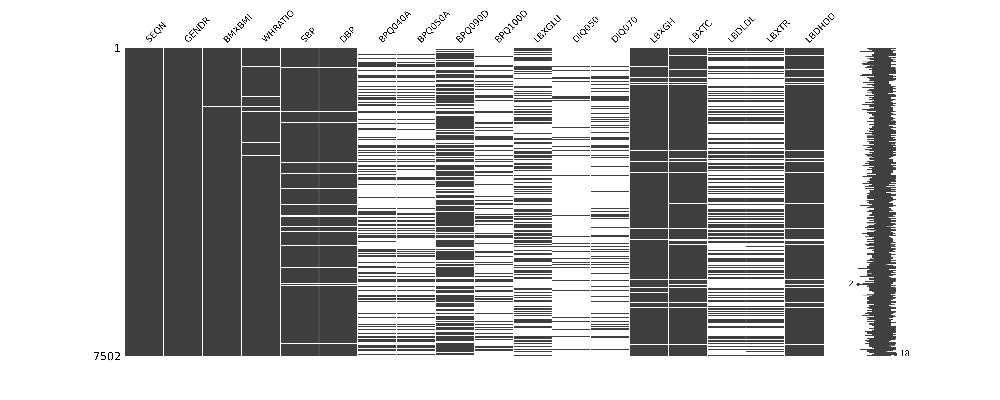

In [ ]:
msno.matrix(merged_df)

In [ ]:
merged_df['Obese'] = (merged_df['BMXBMI'] > 30).astype(int)
merged_df['Hypertension_abnorm'] = ((merged_df['SBP'] >= 140) | (merged_df['DBP'] >= 90)).astype(int)
merged_df['Hypertension_presc'] = ((merged_df['DBP'] >= 90) | (merged_df['BPQ040A'] == 1) | (merged_df['BPQ050A'] == 1)).astype(int)
merged_df['Diabetes_abnorm'] = ((merged_df['LBXGLU'] >= 126)).astype(int)
merged_df['Diabetes_presc'] = ((merged_df['DIQ050'] == 1) | (merged_df['DIQ070'] == 1)).astype(int)
merged_df['Dyslipidemia_abnorm'] = ((merged_df['LBXTC'] >= 190) | (merged_df['LBXTR'] >= 150) | (merged_df['LBDLDL'] >= 115) | ((merged_df['LBDHDD'] < 40))).astype(int)
merged_df['Dyslipidemia_presc'] = (((merged_df['LBDHDD'] < 40) & (merged_df['GENDR'] == 1)) | ((merged_df['LBDHDD'] < 46) & (merged_df['GENDR'] == 2))).astype(int)
print(merged_df['Obese'].value_counts())
print(merged_df['Hypertension_abnorm'].value_counts())
print(merged_df['Hypertension_presc'].value_counts())
print(merged_df['Diabetes_abnorm'].value_counts())
print(merged_df['Diabetes_presc'].value_counts())
print(merged_df['Dyslipidemia_abnorm'].value_counts())
print(merged_df['Dyslipidemia_presc'].value_counts())

Obese
0    4490
1    3012
Name: count, dtype: int64
Hypertension_abnorm
0    6155
1    1347
Name: count, dtype: int64
Hypertension_presc
0    4922
1    2580
Name: count, dtype: int64
Diabetes_abnorm
0    7006
1     496
Name: count, dtype: int64
Diabetes_presc
0    6570
1     932
Name: count, dtype: int64
Dyslipidemia_abnorm
1    3767
0    3735
Name: count, dtype: int64
Dyslipidemia_presc
0    5833
1    1669
Name: count, dtype: int64


In [ ]:
scaler_st = StandardScaler()
merged_df_norm = scaler_st.fit_transform(merged_df.drop(columns=['SEQN',	'GENDR']))
columns_n = list(merged_df.drop(columns=['SEQN',	'GENDR']).columns)
scaler_standard = StandardScaler()
merged_df_st = scaler_standard.fit_transform(merged_df_norm)
merged_df_st = pandas.DataFrame(merged_df_st, columns=columns_n)
merged_df_st['SEQN'] = merged_df['SEQN'].copy(deep=False)
merged_df_st['GENDR'] = merged_df['GENDR'].copy(deep=False)

In [ ]:
disease_dist_df = merged_df.merge(df_with_pca_22[['SEQN', 'PC1', 'PC2', 'PC3']], how='left', on='SEQN')

In [ ]:
whole_foods = df_with_pca_22[df_with_pca_22['Cluster'] == 0]
whole_foods['Whole food'] = True
whole_foods = whole_foods[['SEQN', 'Whole food']]
unbalanced = df_with_pca_22[df_with_pca_22['Cluster'] == 4]
unbalanced['Unbalanced'] = True
unbalanced = unbalanced[['SEQN', 'Unbalanced']]
meat_alcohol = df_with_pca_22[df_with_pca_22['Cluster'] == 1]
meat_alcohol['Meat&Alcohol'] = True
meat_alcohol = meat_alcohol[['SEQN', 'Meat&Alcohol']]
pescatarian = df_with_pca_22_f[df_with_pca_22_f['Cluster'] == 1]
pescatarian['Pescatarian'] = True
pescatarian = pescatarian[['SEQN', 'Pescatarian']]
asian = df_with_pca_22_m[df_with_pca_22_m['Cluster'] == 4]
asian['Asian'] = True
asian = asian[['SEQN', 'Asian']]
print(whole_foods.shape, unbalanced.shape)
clusters_df = whole_foods.merge(unbalanced, how='outer', on='SEQN')
print(clusters_df.shape, len(clusters_df['SEQN'].unique()))
clusters_df = clusters_df.merge(meat_alcohol, how='outer', on='SEQN')
print(clusters_df.shape, len(clusters_df['SEQN'].unique()))
clusters_df = clusters_df.merge(pescatarian, how='outer', on='SEQN')
print(clusters_df.shape, len(clusters_df['SEQN'].unique()))
clusters_df = clusters_df.merge(asian, how='outer', on='SEQN')
print(clusters_df.shape, len(clusters_df['SEQN'].unique()))
clusters_df = clusters_df.merge(merged_df_st[['SEQN','BMXBMI', 'WHRATIO','SBP', 'DBP', 'LBXGLU', 'LBXGH', 'LBXTC', 'LBXTR', 'LBDLDL', 'LBDHDD']], how='inner', on='SEQN')
print(clusters_df.shape, len(clusters_df['SEQN'].unique()))

obesity = (clusters_df[clusters_df['BMXBMI'].notna()])[['SEQN', 'BMXBMI', 'WHRATIO', 'Whole food', 'Unbalanced', 'Meat&Alcohol', 'Pescatarian', 'Asian']]
obesity = obesity[obesity['WHRATIO'].notna()]
obesity.fillna(False, inplace=True)
print(obesity)

(2475, 2) (1761, 2)
(4236, 3) 4236
(6178, 4) 6178
(6183, 5) 6183
(6261, 6) 6261
(6184, 16) 6184
          SEQN    BMXBMI   WHRATIO  Whole food  Unbalanced  Meat&Alcohol  \
0     109274.0  0.074618  1.064609        True       False         False   
1     109279.0 -1.119603 -0.795111        True       False         False   
3     109290.0 -0.197976 -0.688495        True       False         False   
4     109305.0 -1.132583  0.030882        True       False         False   
5     109319.0  0.113560  0.533360        True       False         False   
...        ...       ...       ...         ...         ...           ...   
6179  124233.0 -0.574415 -1.427644       False       False         False   
6180  124280.0  1.437588  1.112814       False       False         False   
6181  124319.0  2.372195  1.853303       False       False         False   
6182  124347.0  0.957303  1.155714       False       False         False   
6183  124500.0  0.048657  0.847995       False       False         F

<ipython-input-58-065ea469c5ae>:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-58-065ea469c5ae>:5: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-58-065ea469c5ae>:8: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-58-065ea46

In [ ]:

# 'Whole food', 'Carbohydrate heavy', 'Meat&Alcohol', 'Pescatarian', 'Asian'
print(sm.OLS(zscore(obesity['BMXBMI']), zscore(obesity['Whole food'])).fit().summary())
print(sm.OLS(zscore(obesity['WHRATIO']), zscore(obesity['Whole food'])).fit().summary())
print(sm.OLS(zscore(obesity['BMXBMI']), zscore(obesity['Unbalanced'])).fit().summary())
print(sm.OLS(zscore(obesity['WHRATIO']), zscore(obesity['Unbalanced'])).fit().summary())
print(sm.OLS(zscore(obesity['BMXBMI']), zscore(obesity['Meat&Alcohol'])).fit().summary())
print(sm.OLS(zscore(obesity['WHRATIO']), zscore(obesity['Meat&Alcohol'])).fit().summary())
print(sm.OLS(zscore(obesity['BMXBMI']), zscore(obesity['Pescatarian'])).fit().summary())
print(sm.OLS(zscore(obesity['WHRATIO']), zscore(obesity['Pescatarian'])).fit().summary())
print(sm.OLS(zscore(obesity['BMXBMI']), zscore(obesity['Asian'])).fit().summary())
print(sm.OLS(zscore(obesity['WHRATIO']), zscore(obesity['Asian'])).fit().summary())


                                 OLS Regression Results                                
Dep. Variable:                 BMXBMI   R-squared (uncentered):                   0.007
Model:                            OLS   Adj. R-squared (uncentered):              0.007
Method:                 Least Squares   F-statistic:                              40.66
Date:                Sun, 28 Apr 2024   Prob (F-statistic):                    1.95e-10
Time:                        22:44:27   Log-Likelihood:                         -8469.2
No. Observations:                5983   AIC:                                  1.694e+04
Df Residuals:                    5982   BIC:                                  1.695e+04
Df Model:                           1                                                  
Covariance Type:            nonrobust                                                  
                 coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------

In [ ]:
hypertension = (clusters_df[clusters_df['SBP'].notna()])[['SEQN', 'SBP', 'DBP', 'Whole food', 'Unbalanced', 'Meat&Alcohol', 'Pescatarian', 'Asian']]
hypertension = hypertension[hypertension['DBP'].notna()]
hypertension.fillna(False, inplace=True)
print(sm.OLS(zscore(hypertension['SBP']), zscore(hypertension['Whole food'])).fit().summary())
print(sm.OLS(zscore(hypertension['DBP']), zscore(hypertension['Whole food'])).fit().summary())
print(sm.OLS(zscore(hypertension['SBP']), zscore(hypertension['Unbalanced'])).fit().summary())
print(sm.OLS(zscore(hypertension['DBP']), zscore(hypertension['Unbalanced'])).fit().summary())
print(sm.OLS(zscore(hypertension['SBP']), zscore(hypertension['Meat&Alcohol'])).fit().summary())
print(sm.OLS(zscore(hypertension['DBP']), zscore(hypertension['Meat&Alcohol'])).fit().summary())
print(sm.OLS(zscore(hypertension['SBP']), zscore(hypertension['Pescatarian'])).fit().summary())
print(sm.OLS(zscore(hypertension['DBP']), zscore(hypertension['Pescatarian'])).fit().summary())
print(sm.OLS(zscore(hypertension['SBP']), zscore(hypertension['Asian'])).fit().summary())
print(sm.OLS(zscore(hypertension['DBP']), zscore(hypertension['Asian'])).fit().summary())

                                 OLS Regression Results                                
Dep. Variable:                    SBP   R-squared (uncentered):                   0.000
Model:                            OLS   Adj. R-squared (uncentered):             -0.000
Method:                 Least Squares   F-statistic:                             0.1337
Date:                Sun, 28 Apr 2024   Prob (F-statistic):                       0.715
Time:                        22:44:27   Log-Likelihood:                         -8146.1
No. Observations:                5741   AIC:                                  1.629e+04
Df Residuals:                    5740   BIC:                                  1.630e+04
Df Model:                           1                                                  
Covariance Type:            nonrobust                                                  
                 coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------

In [ ]:
diabetes_glucose = (clusters_df[clusters_df['LBXGLU'].notna()])[['SEQN', 'LBXGLU', 'Whole food', 'Unbalanced', 'Meat&Alcohol', 'Pescatarian', 'Asian']]
diabetes_hemoglobin = (clusters_df[clusters_df['LBXGH'].notna()])[['SEQN', 'LBXGH', 'Whole food', 'Unbalanced', 'Meat&Alcohol', 'Pescatarian', 'Asian']]
diabetes_glucose.fillna(False, inplace=True)
diabetes_hemoglobin.fillna(False, inplace=True)
print(sm.OLS(zscore(diabetes_glucose['LBXGLU']), zscore(diabetes_glucose['Whole food'])).fit().summary())
print(sm.OLS(zscore(diabetes_hemoglobin['LBXGH']), zscore(diabetes_hemoglobin['Whole food'])).fit().summary())
print(sm.OLS(zscore(diabetes_glucose['LBXGLU']), zscore(diabetes_glucose['Unbalanced'])).fit().summary())
print(sm.OLS(zscore(diabetes_hemoglobin['LBXGH']), zscore(diabetes_hemoglobin['Unbalanced'])).fit().summary())
print(sm.OLS(zscore(diabetes_glucose['LBXGLU']), zscore(diabetes_glucose['Meat&Alcohol'])).fit().summary())
print(sm.OLS(zscore(diabetes_hemoglobin['LBXGH']), zscore(diabetes_hemoglobin['Meat&Alcohol'])).fit().summary())
print(sm.OLS(zscore(diabetes_glucose['LBXGLU']), zscore(diabetes_glucose['Pescatarian'])).fit().summary())
print(sm.OLS(zscore(diabetes_hemoglobin['LBXGH']), zscore(diabetes_hemoglobin['Pescatarian'])).fit().summary())
print(sm.OLS(zscore(diabetes_glucose['LBXGLU']), zscore(diabetes_glucose['Asian'])).fit().summary())
print(sm.OLS(zscore(diabetes_hemoglobin['LBXGH']), zscore(diabetes_hemoglobin['Asian'])).fit().summary())

                                 OLS Regression Results                                
Dep. Variable:                 LBXGLU   R-squared (uncentered):                   0.000
Model:                            OLS   Adj. R-squared (uncentered):              0.000
Method:                 Least Squares   F-statistic:                              1.188
Date:                Sun, 28 Apr 2024   Prob (F-statistic):                       0.276
Time:                        22:44:27   Log-Likelihood:                         -4139.9
No. Observations:                2918   AIC:                                      8282.
Df Residuals:                    2917   BIC:                                      8288.
Df Model:                           1                                                  
Covariance Type:            nonrobust                                                  
                 coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------

In [ ]:
dyslypidemia_cholesterol = (clusters_df[clusters_df['LBXTC'].notna()])[['SEQN', 'LBXTC', 'Whole food', 'Unbalanced', 'Meat&Alcohol', 'Pescatarian', 'Asian']]
dyslypidemia_cholesterol.fillna(False, inplace=True)

dyslypidemia_triglycerides_ldl = (clusters_df[clusters_df['LBXTR'].notna()])[['SEQN', 'LBXTR', 'LBDLDL', 'Whole food', 'Unbalanced', 'Meat&Alcohol', 'Pescatarian', 'Asian']]
dyslypidemia_triglycerides_ldl = (dyslypidemia_triglycerides_ldl[dyslypidemia_triglycerides_ldl['LBDLDL'].notna()])
dyslypidemia_triglycerides_ldl.fillna(False, inplace=True)

dyslypidemia_hdl = (clusters_df[clusters_df['LBDHDD'].notna()])[['SEQN', 'LBDHDD', 'Whole food', 'Unbalanced', 'Meat&Alcohol', 'Pescatarian', 'Asian']]
dyslypidemia_hdl.fillna(False, inplace=True)

print(sm.OLS(zscore(dyslypidemia_cholesterol['LBXTC']), zscore(dyslypidemia_cholesterol['Whole food'])).fit().summary())
print(sm.OLS(zscore(dyslypidemia_triglycerides_ldl['LBXTR']), zscore(dyslypidemia_triglycerides_ldl['Whole food'])).fit().summary())
print(sm.OLS(zscore(dyslypidemia_triglycerides_ldl['LBDLDL']), zscore(dyslypidemia_triglycerides_ldl['Whole food'])).fit().summary())
print(sm.OLS(zscore(dyslypidemia_hdl['LBDHDD']), zscore(dyslypidemia_hdl['Whole food'])).fit().summary())
print(sm.OLS(zscore(dyslypidemia_cholesterol['LBXTC']), zscore(dyslypidemia_cholesterol['Unbalanced'])).fit().summary())
print(sm.OLS(zscore(dyslypidemia_triglycerides_ldl['LBXTR']), zscore(dyslypidemia_triglycerides_ldl['Unbalanced'])).fit().summary())
print(sm.OLS(zscore(dyslypidemia_triglycerides_ldl['LBDLDL']), zscore(dyslypidemia_triglycerides_ldl['Unbalanced'])).fit().summary())
print(sm.OLS(zscore(dyslypidemia_hdl['LBDHDD']), zscore(dyslypidemia_hdl['Unbalanced'])).fit().summary())
print(sm.OLS(zscore(dyslypidemia_cholesterol['LBXTC']), zscore(dyslypidemia_cholesterol['Meat&Alcohol'])).fit().summary())
print(sm.OLS(zscore(dyslypidemia_triglycerides_ldl['LBXTR']), zscore(dyslypidemia_triglycerides_ldl['Meat&Alcohol'])).fit().summary())
print(sm.OLS(zscore(dyslypidemia_triglycerides_ldl['LBDLDL']), zscore(dyslypidemia_triglycerides_ldl['Meat&Alcohol'])).fit().summary())
print(sm.OLS(zscore(dyslypidemia_hdl['LBDHDD']), zscore(dyslypidemia_hdl['Meat&Alcohol'])).fit().summary())
print(sm.OLS(zscore(dyslypidemia_cholesterol['LBXTC']), zscore(dyslypidemia_cholesterol['Pescatarian'])).fit().summary())
print(sm.OLS(zscore(dyslypidemia_triglycerides_ldl['LBXTR']), zscore(dyslypidemia_triglycerides_ldl['Pescatarian'])).fit().summary())
print(sm.OLS(zscore(dyslypidemia_triglycerides_ldl['LBDLDL']), zscore(dyslypidemia_triglycerides_ldl['Pescatarian'])).fit().summary())
print(sm.OLS(zscore(dyslypidemia_hdl['LBDHDD']), zscore(dyslypidemia_hdl['Pescatarian'])).fit().summary())
print(sm.OLS(zscore(dyslypidemia_cholesterol['LBXTC']), zscore(dyslypidemia_cholesterol['Asian'])).fit().summary())
print(sm.OLS(zscore(dyslypidemia_triglycerides_ldl['LBXTR']), zscore(dyslypidemia_triglycerides_ldl['Asian'])).fit().summary())
print(sm.OLS(zscore(dyslypidemia_triglycerides_ldl['LBDLDL']), zscore(dyslypidemia_triglycerides_ldl['Asian'])).fit().summary())
print(sm.OLS(zscore(dyslypidemia_hdl['LBDHDD']), zscore(dyslypidemia_hdl['Asian'])).fit().summary())

                                 OLS Regression Results                                
Dep. Variable:                  LBXTC   R-squared (uncentered):                   0.001
Model:                            OLS   Adj. R-squared (uncentered):              0.000
Method:                 Least Squares   F-statistic:                              3.811
Date:                Sun, 28 Apr 2024   Prob (F-statistic):                      0.0510
Time:                        22:44:27   Log-Likelihood:                         -8181.1
No. Observations:                5767   AIC:                                  1.636e+04
Df Residuals:                    5766   BIC:                                  1.637e+04
Df Model:                           1                                                  
Covariance Type:            nonrobust                                                  
                 coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------

In [ ]:
disease_dist_df['GENDER_LABEL'] = disease_dist_df['GENDR'].map({1: 'Male', 2: 'Female'})

In [ ]:
disease_dist_df['Hypertension'] = disease_dist_df['Hypertension_abnorm'].map({0: 'Norm', 1: 'Abnorm'})
disease_dist_df['Dyslipidemia'] = disease_dist_df['Dyslipidemia_abnorm'].map({0: 'Norm', 1: 'Abnorm'})
disease_dist_df['Diabetes'] = disease_dist_df['Diabetes_abnorm'].map({0: 'Norm', 1: 'Abnorm'})
disease_dist_df['Obesity'] = disease_dist_df['Obese'].map({0: 'Norm', 1: 'Abnorm'})

In [ ]:
def health_condition_depicting(pc_1, pc_2, loadings, df, disease_df, condition, food_groups):
    selected_loadings = loadings.loc[food_groups]
    selected_loadings = selected_loadings[[pc_1, pc_2]]
    for cluster in range(3):
        cluster_df = df[df['Cluster'] == cluster]
        cluster_df = cluster_df.merge(disease_df[['SEQN', condition, 'GENDER_LABEL']], how='left', on='SEQN')
        print(f'{(len(cluster_df[cluster_df[condition]=="Abnorm"])/len(cluster_df))*100}%')
        fig = px.scatter(cluster_df[[pc_1, pc_2]],
                         x=pc_1,
                         y=pc_2,
                         color=cluster_df[condition],
                         symbol = cluster_df.GENDER_LABEL,
                         color_discrete_map={"Abnorm": "#FFC22B", "Norm": "#079493"},
                         opacity=0.75
                         )
        # fig = px.scatter(cluster_df[[pc_1, pc_2]], x=pc_1, y=pc_2, color=cluster_df.Cluster, color_continuous_scale='emrld', range_color=[0,2])
        fig.update_layout(legend_valign='bottom')
        # fig.show()
        for col in food_groups:
            fig.add_annotation(
                ax=0, ay=0,
                axref="x", ayref="y",
                x=selected_loadings.loc[col][pc_1]*70,
                y=selected_loadings.loc[col][pc_2]*70,
                showarrow=True,
                arrowsize=2,
                arrowhead=2,
                xanchor="right",
                yanchor="top",
                arrowcolor="black"
            )
            fig.add_annotation(
                x=selected_loadings.loc[col][pc_1]*70,
                y=selected_loadings.loc[col][pc_2]*70,
                ax=0, ay=0,
                xanchor="center",
                yanchor="bottom",
                text=col,
                yshift=5
            )
        fig.show()
# health_condition_depicting('PC3', 'PC2', loadings_22, df_with_pca_22, disease_dist_df, 'Obesity', food_groups_22)
# health_condition_depicting('PC3', 'PC2', loadings_22, df_with_pca_22, disease_dist_df, 'Hypertension', food_groups_22)
# health_condition_depicting('PC3', 'PC2', loadings_22, df_with_pca_22, disease_dist_df, 'Diabetes', food_groups_22)
health_condition_depicting('PC3', 'PC2', loadings_22, df_with_pca_22, disease_dist_df, 'Dyslipidemia', food_groups_22)

51.070707070707066%


50.10298661174048%


42.88194444444444%


##Diatery patterns using RRR derived coefficients##

In [ ]:
# import numpy as np
inplace_0 = (clusters_df[['Whole food', 'Unbalanced', 'Meat&Alcohol', 'Pescatarian', 'Asian']]).copy(deep=False)
inplace_0.replace(np.nan, 0, inplace=True)
inplace_0.replace(True, 1, inplace=True)
clusters_df[['Whole food', 'Unbalanced', 'Meat&Alcohol', 'Pescatarian', 'Asian']] = inplace_0
clusters_df_2 = clusters_df.drop(columns=['LBXGLU', 'LBXTR', 'LBDLDL'])
nan_counts = clusters_df_2.isna().sum()
print(nan_counts)

SEQN              0
Whole food        0
Unbalanced        0
Meat&Alcohol      0
Pescatarian       0
Asian             0
BMXBMI           71
WHRATIO         196
SBP             443
DBP             443
LBXGH           307
LBXTC           417
LBDHDD          417
dtype: int64


In [ ]:
clusters_df_2

,SEQN,Whole food,Unbalanced,Meat&Alcohol,Pescatarian,Asian,BMXBMI,WHRATIO,SBP,DBP,LBXGH,LBXTC,LBDHDD
0,109274.0,1,0,0,0,0,0.074618,1.064609,0.608661,-0.300088,-0.082438,-1.883415,-1.556939
1,109279.0,1,0,0,0,0,-1.119603,-0.795111,-1.122635,-1.059433,-0.730850,0.007584,0.064834
2,109282.0,1,0,0,0,0,-0.392686,NaN,0.891322,-0.066443,-0.267698,1.260064,-0.648746
3,109290.0,1,0,0,0,0,-0.197976,-0.688495,-0.062658,-1.147050,2.418583,-0.409909,-0.843359
4,109305.0,1,0,0,0,1,-1.132583,0.030882,-0.150989,0.137996,-0.545590,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...
6179,124233.0,0,0,0,0,1,-0.574415,-1.427644,-1.246299,-1.643545,-0.452959,-0.532701,-0.259521
6180,124280.0,0,0,0,0,1,1.437588,1.112814,0.114005,0.868135,0.288084,NaN,NaN
6181,124319.0,0,0,0,0,1,2.372195,1.853303,0.255335,1.393836,NaN,NaN,NaN
6182,124347.0,0,0,0,0,1,0.957303,1.155714,1.827635,3.029348,-1.564524,-0.753727,-0.778488


In [ ]:

def create_dataframe_for_rrr_food_groups():
    df_r = merged_df_st[['SEQN','BMXBMI', 'WHRATIO', 'SBP', 'DBP', 'LBXGH', 'LBXTC', 'LBDHDD']].copy(deep=False)
    foods = df_original_22[['SEQN']+food_groups_22]
    df_r = df_r.merge(foods, how='left', on='SEQN')
    print(df_r.shape)
    df_r = df_r.dropna()
    print(df_r.shape)
    df_r.to_excel("food_data.xlsx")

def create_dataframe_for_rrr_clusters_gen(data):
    df = data.copy(deep=False)
    df['Pizza'] = df['SEQN'].isin(pizza['SEQN']).astype(int)
    df['Mexican'] = df['SEQN'].isin(mexican['SEQN']).astype(int)
    df.drop(columns=['Pescatarian', 'Asian'], inplace=True)
    print(df.shape)
    df = df.dropna()
    print(df.shape)
    df.to_excel("cluster_data_gen.xlsx")

def create_dataframe_for_rrr_clusters_male(data):
    df = data.copy(deep=False)
    df['Pizza(m)'] = df['SEQN'].isin(pizza_m['SEQN']).astype(int)
    df['Unbalanced(m)'] = df['SEQN'].isin(unbalanced_m['SEQN']).astype(int)
    df['Meat&Grains(m)'] = df['SEQN'].isin(meat_grains_m['SEQN']).astype(int)
    df['Alcohol&Meat(m)'] = df['SEQN'].isin(alcohol_meat_m['SEQN']).astype(int)
    df.rename(columns={'Asian': 'Asian(m)'}, inplace=True)
    df.drop(columns=['Whole food', 'Unbalanced', 'Meat&Alcohol', 'Pescatarian'], inplace=True)
    print(df.shape)
    df = df.dropna()
    print(df.shape)
    df.to_excel("cluster_data_male.xlsx")

def create_dataframe_for_rrr_clusters_female(data):
    df = data.copy(deep=False)
    df['Whole food(f)'] = df['SEQN'].isin(whole_foods_f['SEQN']).astype(int)
    df['Mexican(f)'] = df['SEQN'].isin(mexican_f['SEQN']).astype(int)
    df['Unbalanced(f)'] = df['SEQN'].isin(unbalanced_f['SEQN']).astype(int)
    df['Meat&Alcohol(f)'] = df['SEQN'].isin(meat_alcohol_f['SEQN']).astype(int)
    df.rename(columns={'Pescatarian': 'Pescatarian(f)'}, inplace=True)
    df.drop(columns=['Whole food', 'Unbalanced', 'Meat&Alcohol', 'Asian'], inplace=True)
    print(df.shape)
    df = df.dropna()
    print(df.shape)
    df.to_excel("cluster_data_female.xlsx")

create_dataframe_for_rrr_clusters_gen(clusters_df_2)
create_dataframe_for_rrr_clusters_male(clusters_df_2)
create_dataframe_for_rrr_clusters_female(clusters_df_2)
clusters_df_2.columns

(6184, 13)
(5258, 13)
(6184, 13)
(5258, 13)
(6184, 13)
(5258, 13)


Index(['SEQN', 'Whole food', 'Unbalanced', 'Meat&Alcohol', 'Pescatarian',
       'Asian', 'BMXBMI', 'WHRATIO', 'SBP', 'DBP', 'LBXGH', 'LBXTC', 'LBDHDD'],
      dtype='object')

In [ ]:
df_for_rrr = df_with_pca_22.drop(columns=['Cluster', 'DR1TATOC', 'DR1TATOA', 'DR1TRET',
       'DR1TVARA', 'DR1TACAR', 'DR1TBCAR', 'DR1TCRYP', 'DR1TLYCO', 'DR1TLZ',
       'DR1TVB1', 'DR1TVB2', 'DR1TNIAC', 'DR1TVB6', 'DR1TFOLA', 'DR1TFA',
       'DR1TFF', 'DR1TFDFE', 'DR1TCHL', 'DR1TVB12', 'DR1TB12A', 'DR1TVC',
       'DR1TVD', 'DR1TVK', 'DR1TCALC', 'DR1TPHOS', 'DR1TMAGN', 'DR1TIRON',
       'DR1TZINC', 'DR1TCOPP', 'DR1TSODI', 'DR1TPOTA', 'DR1TSELE', 'DR1TCAFF',
       'DR1TTHEO', 'DR1TALCO', 'WATERCONS']+food_groups_22)

In [ ]:
groups_22 = ['GROUP_7', 'GROUP_14', 'GROUP_15',
          'GROUP_16', 'GROUP_17', 'GROUP_18', 'GROUP_27', 'GROUP_32', 'GROUP_37',
          'GROUP_38', 'GROUP_41', 'GROUP_1_2_3_4', 'GROUP_5_6_9_11',
          'GROUP_8_10_12', 'GROUP_13_19_20_21', 'GROUP_22_23_24_25_26',
          'GROUP_28_29_30_31', 'GROUP_33_34_36', 'GROUP_35_42_43', 'GROUP_39_40',
          'GROUP_45_46']

In [ ]:
rrr_coefs = pandas.read_excel('rrr_coefs.xlsx')
rrr_coefs['FOOD_GROUP'] = groups_22
rrr_coefs.set_index('FOOD_GROUP', inplace=True)
print(rrr_coefs)
# conditn = (rrr_coefs >= 0.10).sum()
# print(conditn)
# print(conditn)
# print((len(rrr_coefs) / 5))
# selected_columns = rrr_coefs.loc[:, conditn >= (len(rrr_coefs) / 5)]
# selected_columns = rrr_coefs.loc[:, rrr_coefs >= 0.10]
# thresholds = {'WHRATIO': 4, 'SBP':4, 'LBXGH':7, 'LBXTC':7}
groups_rrr = {}
for col in rrr_coefs.keys():
    print(col)
    selected_rows = (rrr_coefs[abs(rrr_coefs[col]) >= 0.10])[col]
    print(selected_rows)
#     groups = selected_rows.index
#     median_consumption = df_with_pca_22[groups].median()
#     filtered_data = df_with_pca_22[(df_with_pca_22[groups] > median_consumption).sum(axis=1) >= thresholds[val]]
#     groups_rrr[val] = filtered_data
#     print(filtered_data.shape)
#     print()
# print(groups_rrr)

                        BMXBMI   WHRATIO       SBP       DBP     LBXGH  \
FOOD_GROUP                                                               
GROUP_7               0.019337  0.069122  0.083208  0.062077  0.118732   
GROUP_14             -0.006235  0.038360  0.037136  0.054526  0.106694   
GROUP_15             -0.003913  0.085524  0.049468  0.074387  0.163999   
GROUP_16             -0.035423  0.022277  0.036427  0.042565  0.154960   
GROUP_17              0.001920  0.172421  0.110282  0.102019  0.262058   
GROUP_18             -0.042031  0.041488  0.032396  0.027377  0.097857   
GROUP_27             -0.022419  0.037069  0.067596  0.021793  0.116528   
GROUP_32              0.017914  0.049041  0.063639  0.065268  0.132456   
GROUP_37             -0.052647  0.129928  0.139276  0.177069  0.073003   
GROUP_38              0.010242 -0.004994 -0.004301  0.005256  0.013110   
GROUP_41             -0.030087 -0.029866 -0.035390 -0.017006  0.023008   
GROUP_1_2_3_4        -0.034111  0.0576

In [ ]:
# loadings_22_names = loadings_22.rename(index=name_mapping)
rrr_coefs.rename(index=name_mapping, inplace=True)
rrr_coefs.index

Index(['Seafood', 'Asian', 'Mexican', 'Pizza', 'Sandwiches', 'Soups', 'Fruits',
       'Potatoes', 'Alcohol', 'GROUP_38', 'Sauces', 'Dairy', 'Meat',
       'Plant protein', 'Grains', 'Snacks&Sweets', 'Vegetables', 'Beverages',
       'Sugars', 'Fats', 'Other'],
      dtype='object', name='FOOD_GROUP')

In [ ]:
fig = px.imshow(rrr_coefs.T,
                x=rrr_coefs.index,
                y=rrr_coefs.columns,
                color_continuous_scale='rdbu')
fig.update_layout(title='Correlation Heatmap of Food Groups and Health Indicators',
                  xaxis_title='Food Groups',
                  yaxis_title='Health Indicator')
fig.show()

In [ ]:
rrr_coefs_cl_gen = pandas.read_excel('rrr_coefs_cl_gen.xlsx')
rrr_coefs_cl_male = pandas.read_excel('rrr_coefs_cl_male.xlsx')
rrr_coefs_cl_female = pandas.read_excel('rrr_coefs_cl_female.xlsx')
rrr_coefs_cl_gen['DIETARY_PATTERN'] = ['Whole food', 'Unbalanced', 'Meat&Alcohol', 'Pizza', 'Mexican']
rrr_coefs_cl_female['DIETARY_PATTERN'] = ['Pescatarian(f)', 'Whole food(f)', 'Mexican(f)', 'Unbalanced(f)', 'Meat&Alcohol(f)']
rrr_coefs_cl_male['DIETARY_PATTERN'] = ['Asian(m)', 'Pizza(m)', 'Unbalanced(m)', 'Meat&Grains(m)', 'Alcohol&Meat(m)']
rrr_coefs_cl_gen.set_index('DIETARY_PATTERN', inplace=True)
rrr_coefs_cl_male.set_index('DIETARY_PATTERN', inplace=True)
rrr_coefs_cl_female.set_index('DIETARY_PATTERN', inplace=True)

In [ ]:
from plotly.subplots import make_subplots

# [[0.0, "rgb(4,68,251)"],
#                 [0.5, "rgb(255,255,255)"],
#                 [1.0, "rgb(255,142,28)"]]
# Create subplots
fig = make_subplots(rows=1, cols=3, shared_yaxes=True,
                    subplot_titles=("Joint", "Male", "Female"), )

# Create heatmap for each subplot
for i, data in enumerate([rrr_coefs_cl_gen, rrr_coefs_cl_male, rrr_coefs_cl_female], start=1):
    heatmap = px.imshow(data.T,
                        x=data.index,
                        y=data.columns)
    fig.add_trace(heatmap.data[0], row=1, col=i)

# Update layout
fig.update_layout(title_text='Correlation Heatmap of Dietary Patterns and Health Indicators',
                  title_font_size=20,
                  title_x=0.5,
                  xaxis=dict(title='Dietary Pattern'),
                  yaxis=dict(title='Health Indicator'),
                  yaxis2=dict(title=''),
                  yaxis3=dict(title=''),
                  coloraxis = {'colorscale':'rdbu'})
# Show figure
fig.show()

# fig = px.imshow(rrr_coefs_cl_gen.T,
#                 x=rrr_coefs_cl_gen.index,
#                 y=rrr_coefs_cl_gen.columns,
#                 color_continuous_scale='rdbu')
# fig.update_layout(title='Correlation Heatmap of Dietary Patterns and Health Indicators(Joint)',
#                   xaxis_title='Dietary Pattern ',
#                   yaxis_title='Health Indicator')
# fig.show()

In [ ]:
rrr_coefs['Absolute_Sum'] = rrr_coefs.abs().sum(axis=1)
top_six_groups = rrr_coefs.sort_values(by='Absolute_Sum', ascending=False).head(6)
# Extract top three patterns
top_six_groups_names = top_six_groups.index.tolist()
top_six_groups_values = top_six_groups.values.tolist()

# Print the top three patterns
print("Top six food groups with the largest sum of absolute coefficient values:")
for pattern in top_six_groups_names:
    print(pattern, top_six_groups.loc[pattern]['Absolute_Sum'])

Top six food groups with the largest sum of absolute coefficient values:
Alcohol 0.9390019880195808
Meat 0.9249002130821906
Grains 0.8930635173832009
Sandwiches 0.8381321986672988
Snacks&Sweets 0.7659951105110885
Plant protein 0.7351962202068754


In [ ]:
rrr_coefs_cl_gen['Absolute_Sum'] = rrr_coefs_cl_gen.abs().sum(axis=1)
top_three_patterns_gen = rrr_coefs_cl_gen.sort_values(by='Absolute_Sum', ascending=False).head(3)

# Extract top three patterns
top_three_patterns_names_gen = top_three_patterns_gen.index.tolist()

# Print the top three patterns
print("Top three dietary patterns with the largest sum of absolute coefficient values(joint):")
for pattern in top_three_patterns_names_gen:
    print(pattern)
print()
rrr_coefs_cl_male['Absolute_Sum'] = rrr_coefs_cl_male.abs().sum(axis=1)
top_two_patterns_male = rrr_coefs_cl_male.sort_values(by='Absolute_Sum', ascending=False).head(2)

# Extract top three patterns
top_two_patterns_names_male = top_two_patterns_male.index.tolist()

# Print the top three patterns
print("Top two dietary patterns with the largest sum of absolute coefficient values(male):")
for pattern in top_two_patterns_names_male:
    print(pattern)
print()
rrr_coefs_cl_female['Absolute_Sum'] = rrr_coefs_cl_female.abs().sum(axis=1)
top_three_patterns_female = rrr_coefs_cl_female.sort_values(by='Absolute_Sum', ascending=False).head(3)

# Extract top three patterns
top_three_patterns_names_female = top_three_patterns_female.index.tolist()

# Print the top three patterns
print("Top three dietary patterns with the largest sum of absolute coefficient values(female):")
for pattern in top_three_patterns_names_female:
    print(pattern)

Top three dietary patterns with the largest sum of absolute coefficient values(joint):
Pizza
Mexican
Meat&Alcohol

Top two dietary patterns with the largest sum of absolute coefficient values(male):
Pizza(m)
Alcohol&Meat(m)

Top three dietary patterns with the largest sum of absolute coefficient values(female):
Mexican(f)
Pescatarian(f)
Meat&Alcohol(f)


In [ ]:
indicator_sum_gen = rrr_coefs_cl_gen.abs().sum()
top_indicators_gen = indicator_sum_gen.sort_values(ascending=False).head(3)
print("Top three health indicators mostly influenced by dietary patterns (joint):")
print(top_indicators_gen)
print()

# For males
indicator_sum_male = rrr_coefs_cl_male.abs().sum()
top_indicators_male = indicator_sum_male.sort_values(ascending=False).head(3)
print("Top three health indicators mostly influenced by dietary patterns (male):")
print(top_indicators_male)
print()

# For females
indicator_sum_female = rrr_coefs_cl_female.abs().sum()
top_indicators_female = indicator_sum_female.sort_values(ascending=False).head(3)
print("Top three health indicators mostly influenced by dietary patterns (female):")
print(top_indicators_female)

Top three health indicators mostly influenced by dietary patterns (joint):
Absolute_Sum    4.754591
LBDHDD          1.631546
WHRATIO         0.640648
dtype: float64

Top three health indicators mostly influenced by dietary patterns (male):
Absolute_Sum    8.489474
WHRATIO         2.353771
LBDHDD          1.757117
dtype: float64

Top three health indicators mostly influenced by dietary patterns (female):
Absolute_Sum    6.331423
WHRATIO         1.572354
LBDHDD          1.353015
dtype: float64


###Demographical Data Overview###
Overview of data about the demographics of individuals, cleaning the data, visualizations, dropping unnecessary columns and renaming uninformative labels.

In [ ]:
print(demo_df.shape)
print(demo_df.head(10))
demo_df = demo_df.drop(columns = ['SDDSRVYR', 'RIDRETH1', 'SIALANG', 'SIAPROXY', 'SIAINTRP', 'FIALANG',
                        'FIAPROXY', 'FIAINTRP', 'MIALANG', 'MIAPROXY', 'MIAINTRP', 'AIALANGA',
                        'WTINTPRP', 'WTINTPRP', 'WTMECPRP', 'SDMVPSU', 'SDMVSTRA'])
demo_df = demo_df.rename(columns={'RIDSTATR': 'INTRVW_STATUS', 'RIAGENDR':'GENDR',
                        'RIDAGEYR':'AGE_YR', 'RIDAGEMN':'AGEMNS', 'RIDRETH3':'RACE',
                        'RIDEXMON': 'PERIOD', 'DMDBORN4':'ORGCOUNTRY',
                        'DMDYRUSZ':'TIMEUS', 'DMDEDUC2':'EDUCTN', 'DMDMARTZ':'MARITALSTS',
                        'RIDEXPRG': 'PREGNSTATUS', 'INDFMPIR': 'INCOMEPOVERTY'})
print(demo_df.shape)
print(demo_df.head(10))

(15560, 29)
       SEQN  SDDSRVYR  RIDSTATR  RIAGENDR      RIDAGEYR  RIDAGEMN  RIDRETH1  \
0  109263.0      66.0       2.0       1.0  2.000000e+00       NaN       5.0   
1  109264.0      66.0       2.0       2.0  1.300000e+01       NaN       1.0   
2  109265.0      66.0       2.0       1.0  2.000000e+00       NaN       3.0   
3  109266.0      66.0       2.0       2.0  2.900000e+01       NaN       5.0   
4  109267.0      66.0       1.0       2.0  2.100000e+01       NaN       2.0   
5  109268.0      66.0       1.0       2.0  1.800000e+01       NaN       3.0   
6  109269.0      66.0       2.0       1.0  2.000000e+00       NaN       2.0   
7  109270.0      66.0       2.0       2.0  1.100000e+01       NaN       4.0   
8  109271.0      66.0       2.0       1.0  4.900000e+01       NaN       3.0   
9  109272.0      66.0       2.0       1.0  5.397605e-79       3.0       1.0   

   RIDRETH3  RIDEXMON  DMDBORN4  ...  FIAINTRP  MIALANG  MIAPROXY  MIAINTRP  \
0       6.0       2.0       1.0  ...   

In [ ]:
print(demo_df.info()) # shows that there are Null values in
# AGEMNS as only children under 2 years are counted,
# lots of Nans in PERIOD,
# TIMEUS  - Length of time the participant has been in the US - a lot of missing values, consider removing this row
# EDUCTN - Education level - Adults 20+
# MARITALSTS - Marital status - very few (87 pregnant) - consider to remove
# INCOMEPOVERTY - few missed values
num_demo_desc = demo_df.describe()
print(num_demo_desc)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15560 entries, 0 to 15559
Data columns (total 13 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   SEQN           15560 non-null  float64
 1   INTRVW_STATUS  15560 non-null  float64
 2   GENDR          15560 non-null  float64
 3   AGE_YR         15560 non-null  float64
 4   AGEMNS         987 non-null    float64
 5   RACE           15560 non-null  float64
 6   PERIOD         14300 non-null  float64
 7   ORGCOUNTRY     15560 non-null  float64
 8   TIMEUS         3028 non-null   float64
 9   EDUCTN         9232 non-null   float64
 10  MARITALSTS     9232 non-null   float64
 11  PREGNSTATUS    1874 non-null   float64
 12  INCOMEPOVERTY  13359 non-null  float64
dtypes: float64(13)
memory usage: 1.5 MB
None
               SEQN  INTRVW_STATUS         GENDR        AGE_YR        AGEMNS  \
count   15560.00000   15560.000000  15560.000000  1.556000e+04  9.870000e+02   
mean   117042.50000      

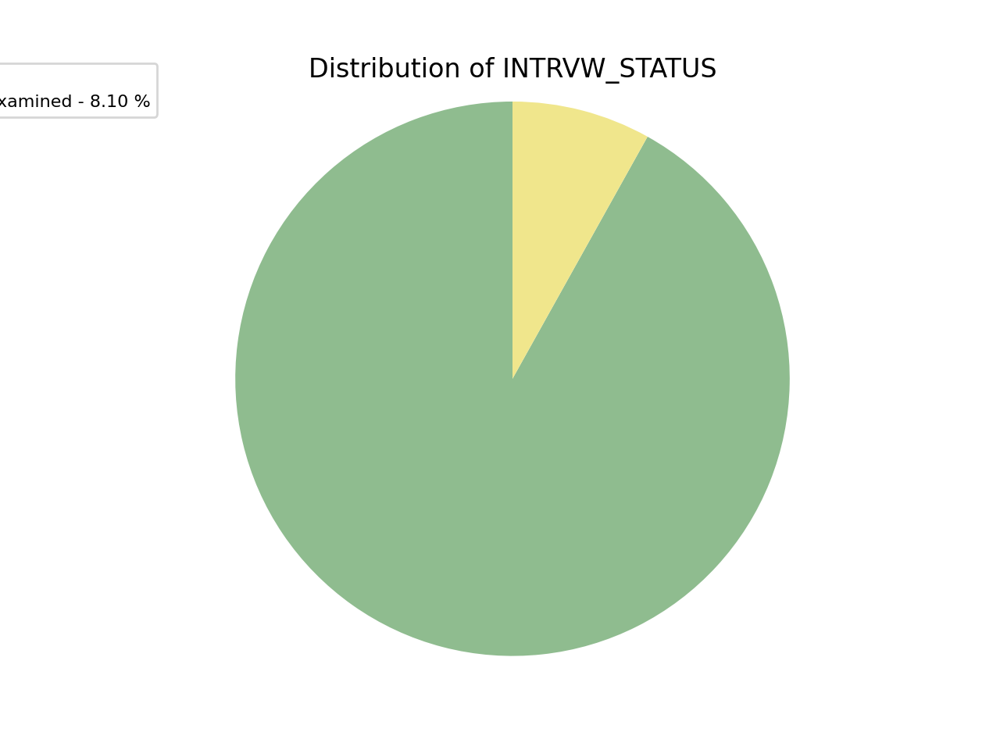

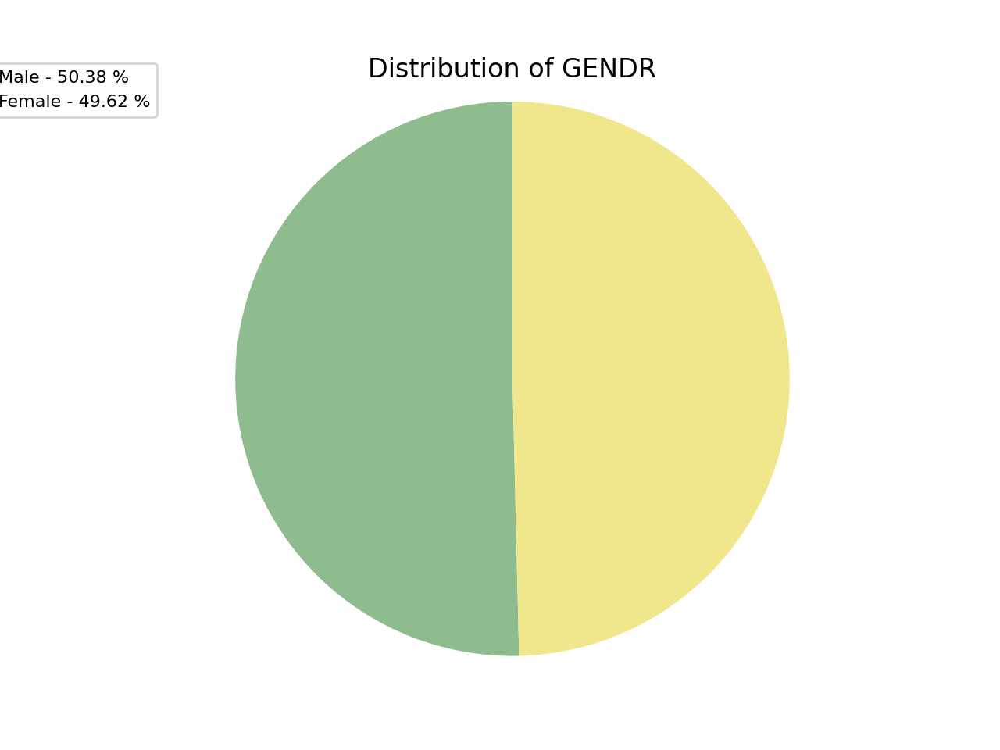

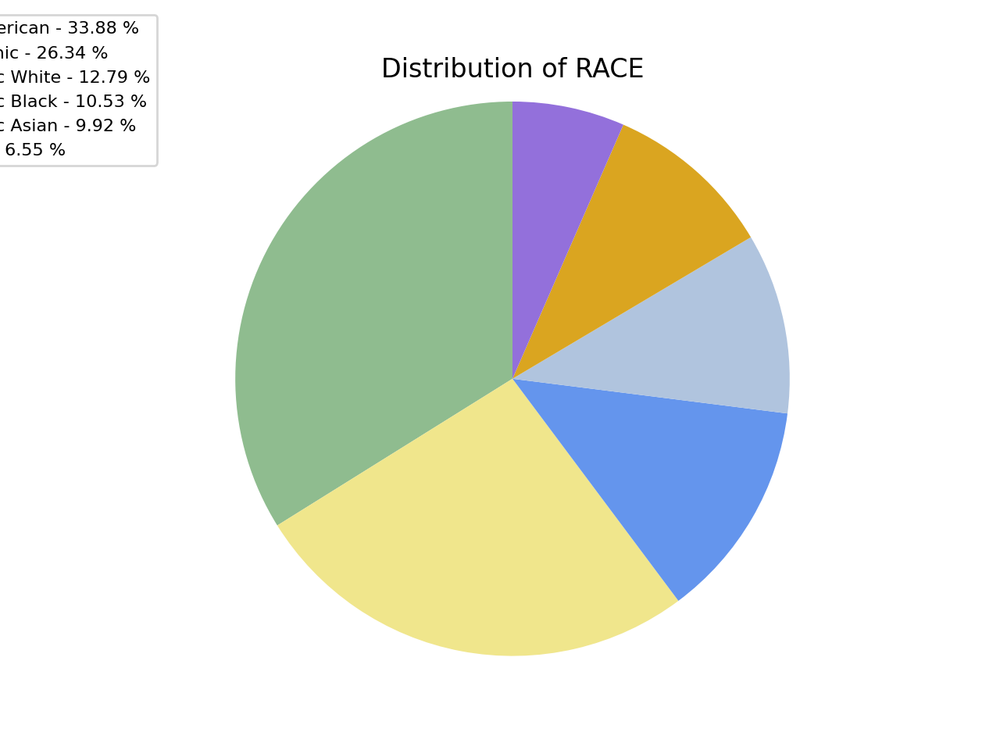

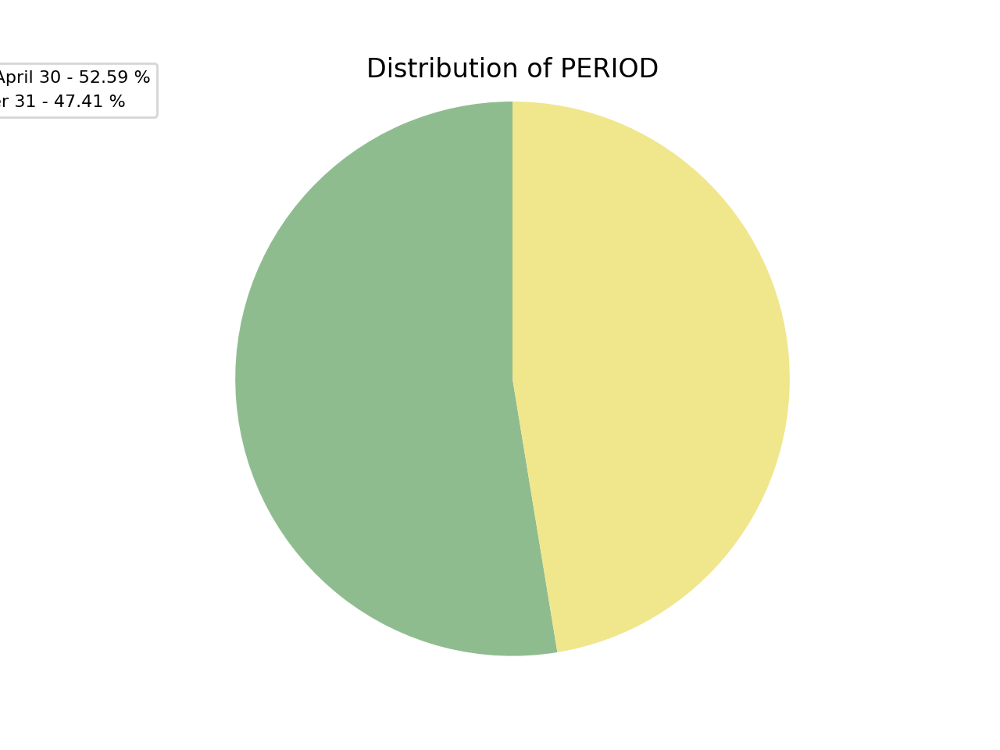

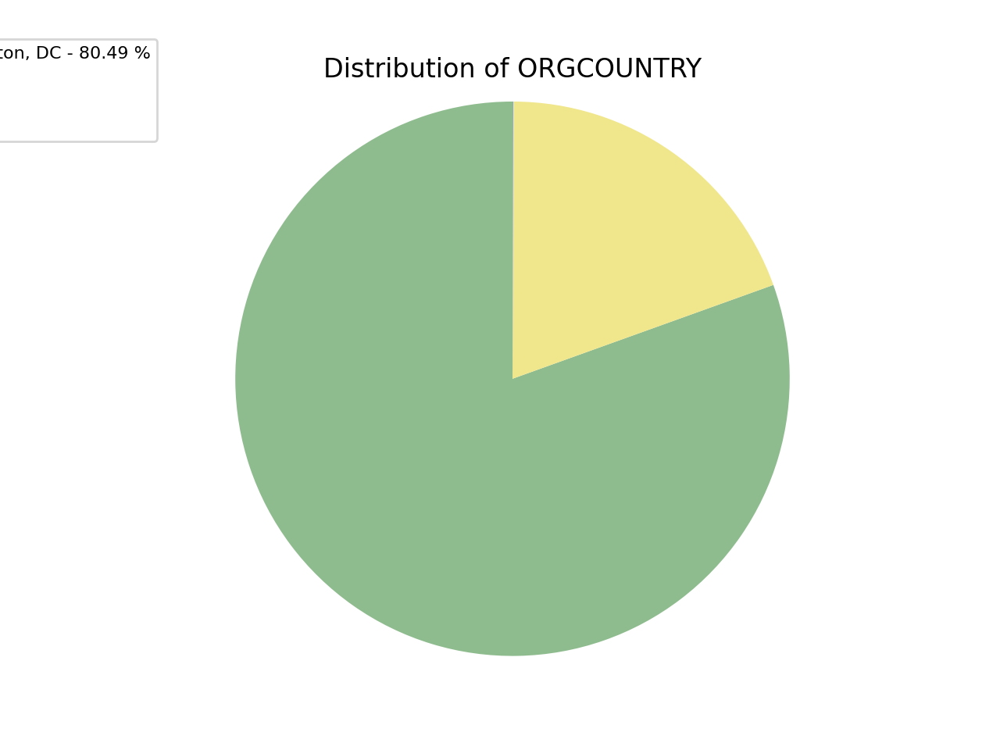

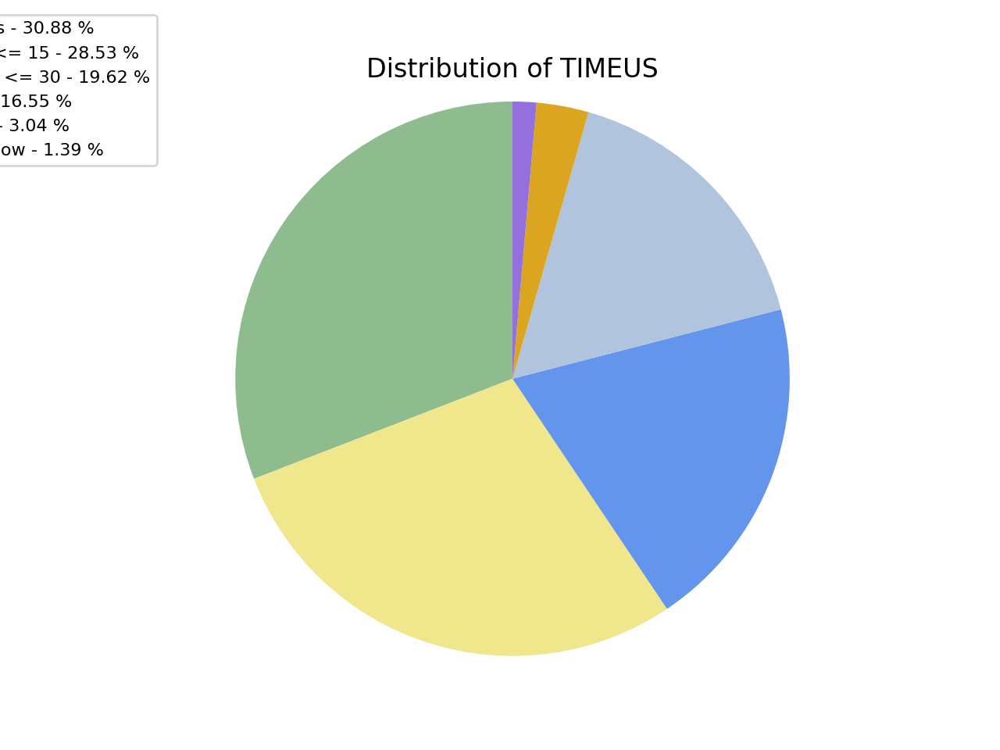

/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning:

Glyph 9 (	) missing from current font.



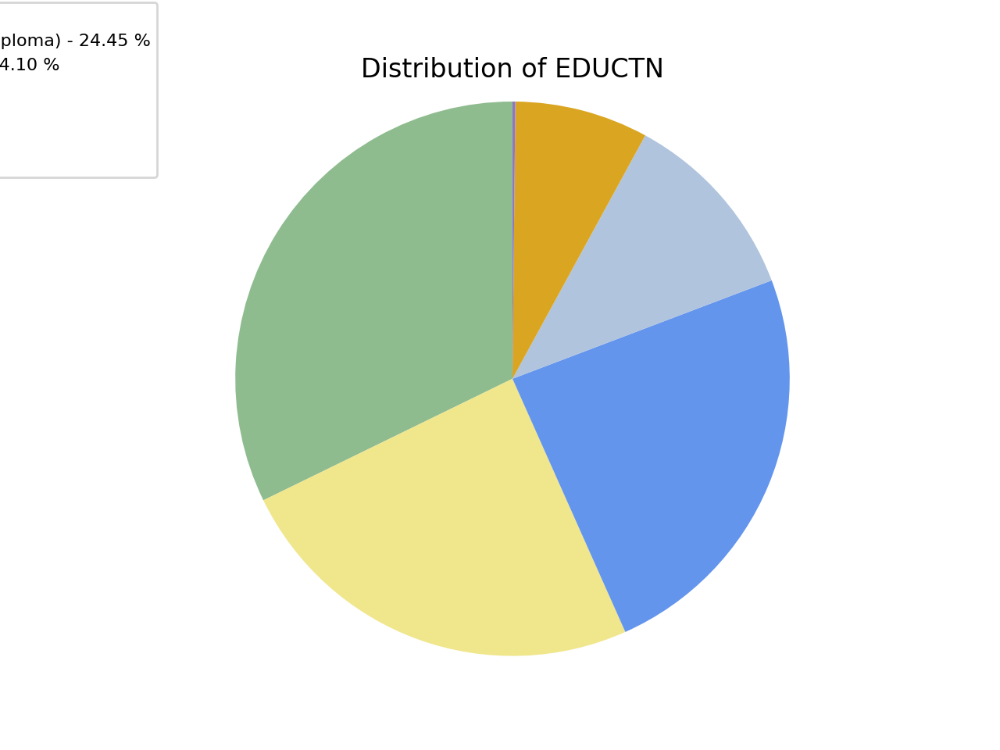

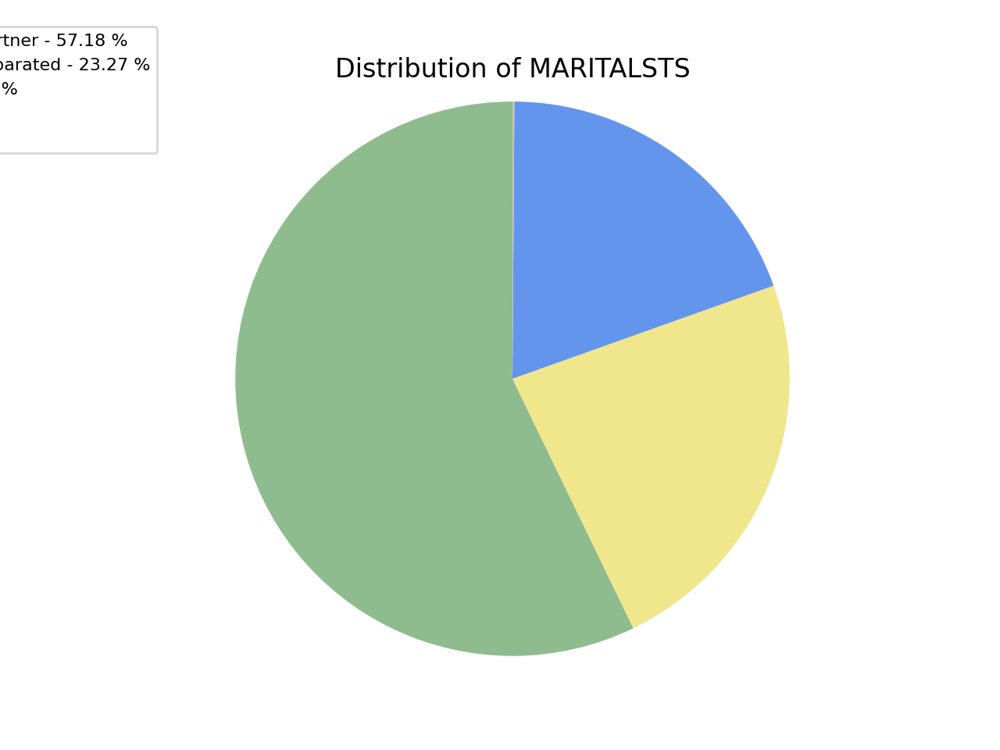

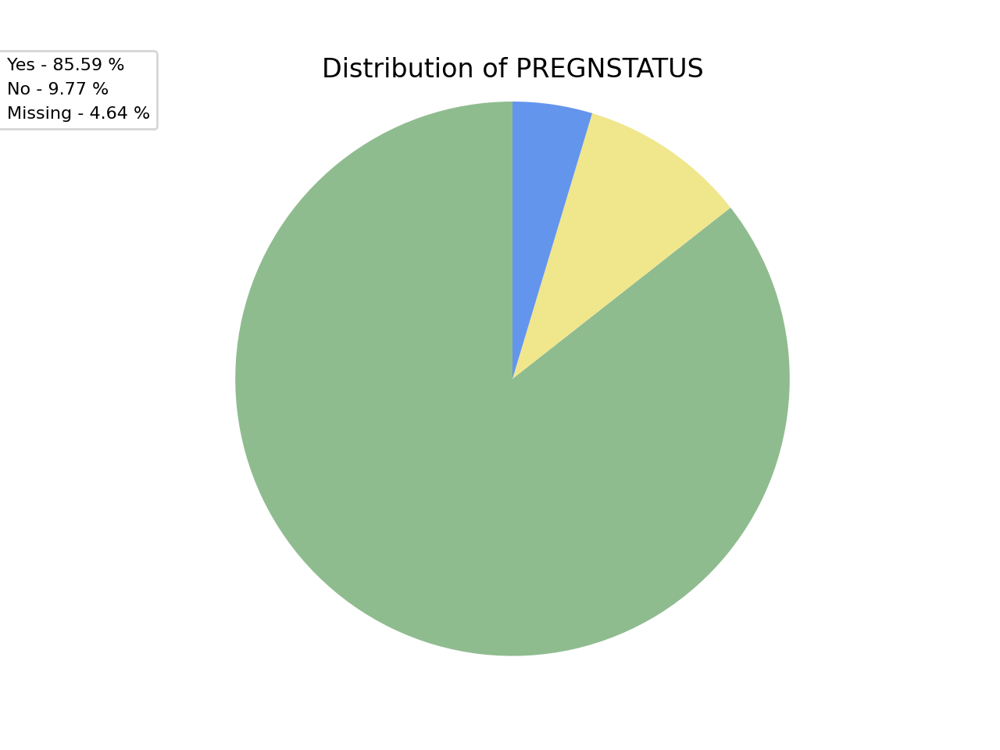

In [ ]:

# categorical data
pie_chart_columns = ['INTRVW_STATUS', 'GENDR', 'RACE', 'PERIOD', 'ORGCOUNTRY', 'TIMEUS', 'EDUCTN', 'MARITALSTS', 'PREGNSTATUS']

for col in pie_chart_columns:
    counts = demo_df[col].value_counts()
    counts = counts/sum(counts)

    x = np.unique(demo_df[col].values)
    y = counts
    percent = 100.*y/y.sum()

    colors_1 = ['darkseagreen','khaki','cornflowerblue','lightsteelblue','goldenrod','mediumpurple', 'darkslategrey','powderblue','olive','violet']
    patches, texts = plt.pie(y, colors=colors_1, startangle=90, radius=1.2)
    label_names = {'INTRVW_STATUS':['Interviewed only', 'Both interviewed and MEC examined'], 'GENDR':['Male', 'Female'], 'RACE':['Mexican American', 'Other Hispanic', 'Non-Hispanic White', 'Non-Hispanic Black', 'Non-Hispanic Asian', 'Other Race'],
                   'PERIOD': ['November 1 through April 30', 'May 1 through October 31', 'missing'], 'ORGCOUNTRY': ['Born in 50 US states or Washington, DC', 'Others', 'Refused', 'Don`t Know'],
                   'TIMEUS': ['<5 years', '5 >= x <= 15', '15 >= x <= 30', '>= 30', 'refused', 'don`t know', 'missing'],
                   'EDUCTN': ['Less than 9th grade', '9-11th grade (Includes 12th grade with no diploma)', '	High school graduate/GED or equivalent', 'Some college or AA degree', 'College graduate or above', 'Refused', 'don`t know', 'missing'],
                   'MARITALSTS': ['Married/Living with Partner', 'Widowed/Divorced/Separated', 'Never married', 'Refused', 'Don`t Know', 'missing'], 'PREGNSTATUS': ['Yes', 'No', 'Missing']}
    labels = ['{0} - {1:1.2f} %'.format(i,j) for i,j in zip(label_names[col], percent)]

    sort_legend = True
    if sort_legend:
        patches, labels, dummy =  zip(*sorted(zip(patches, labels, y),
                                              key=lambda x: x[2],
                                              reverse=True))
    plt.legend(patches, labels, loc='center right', bbox_to_anchor=(-0.1, 1.),
              fontsize=8)
    plt.title(f'Distribution of {col}')
    plt.show()

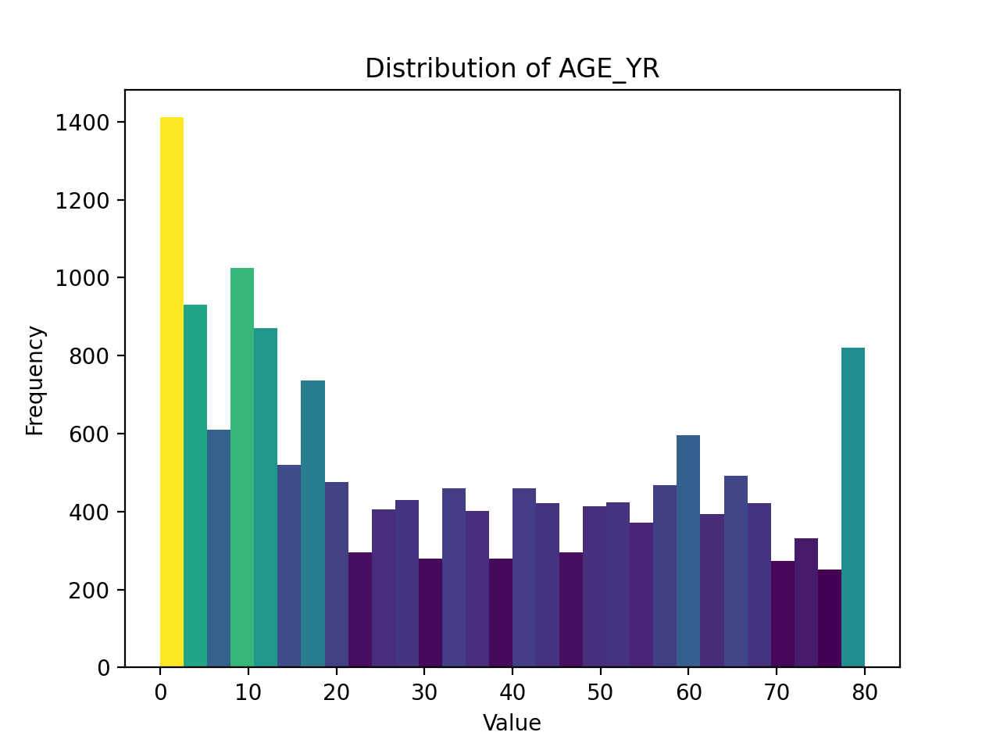

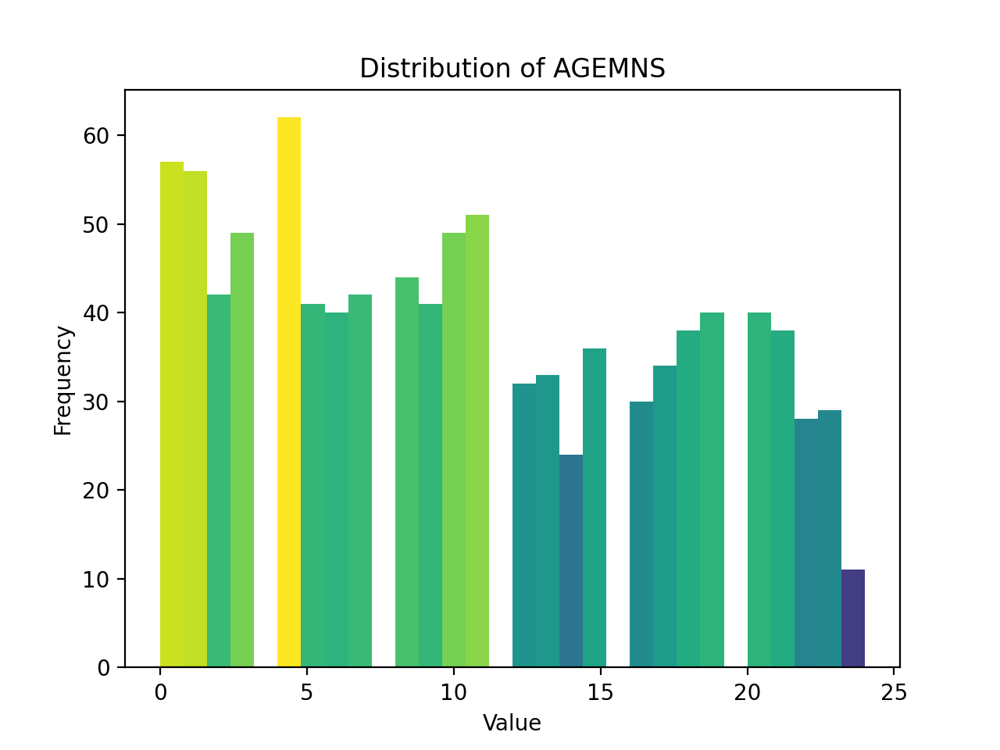

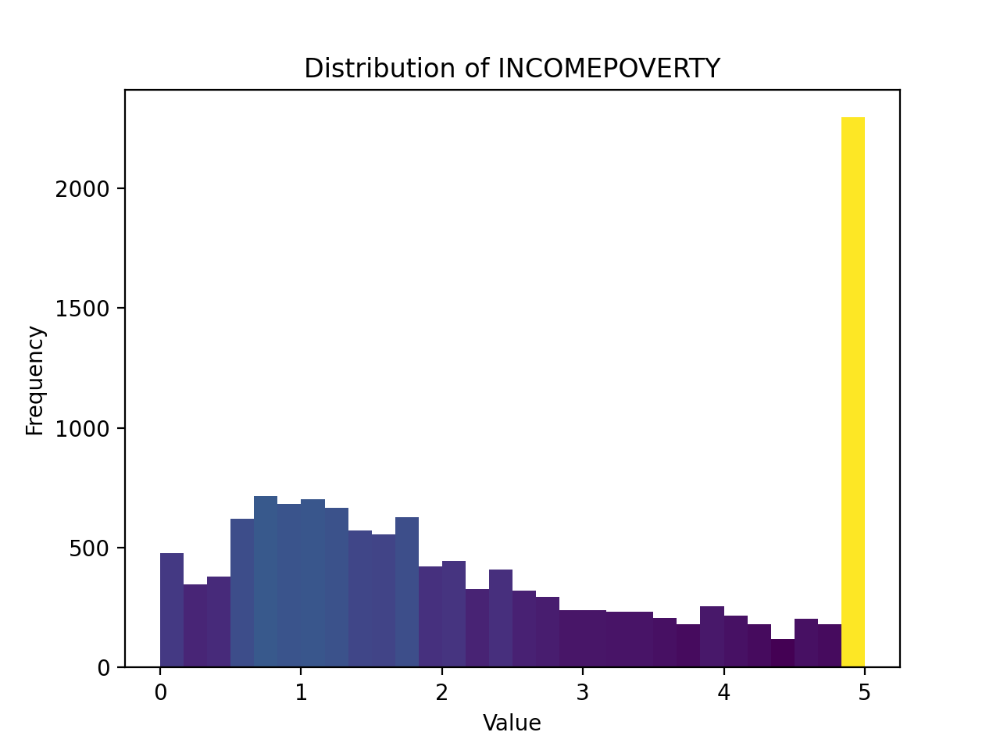

In [ ]:
bar_chart_columns = ['AGE_YR', 'AGEMNS', 'INCOMEPOVERTY']
for col in bar_chart_columns:
    data = demo_df[col]

    # Partly taken from https://matplotlib.org/stable/gallery/statistics/hist.html
    # N is the count in each bin, bins is the lower-limit of the bin
    N, bins, patches = plt.hist(data, bins=30)
    # We'll color code by height, but you could use any scalar
    fracs = N / N.max()
    # we need to normalize the data to 0..1 for the full range of the colormap
    norm = colors.Normalize(fracs.min(), fracs.max())
    # Now, we'll loop through our objects and set the color of each accordingly
    for thisfrac, thispatch in zip(fracs, patches):
        color = plt.cm.viridis(norm(thisfrac))
        thispatch.set_facecolor(color)

    plt.title(f'Distribution of {col}')
    plt.xlabel('Value')
    plt.ylabel('Frequency')
    plt.show()